# Trabalho Prático 2 - ANADI

## Descrição do Trabalho
O objetivo principal deste trabalho consiste na aplicação de algoritmos de aprendizagem
automática na exploração de dados e respetiva comparação usando os testes
estatísticos mais adequados. Deve ser produzido um artigo científico (português ou
inglês), conforme template indicado, com o estado da arte sobre os diferentes
algoritmos, os modelos desenvolvidos, os resultados obtidos, a análise e discussão dos
resultados e as conclusões gerais do trabalho (síntese das conclusões).
Os dados consistem na estimativa dos níveis de obesidade em pessoas com idades entre
os 14 e os 61 anos e diversos hábitos alimentares e condições físicas. Foram recolhidos
dados de 2111 pessoas, nos quais foram obtidos 17 atributos relacionados com hábitos
alimentares e condição física dos participantes.

Os atributos relacionados com os hábitos alimentares são:

 FCCAC - Frequência de Consumo de Comida Altamente Calórica

 FCV - Frequência de Consumo de Vegetais

 NRP - Número de Refeições Principais

 CCER - Consumo de Comida Entre Refeições

 CA - Consumo de Água

 CBA - Consumo de Bebidas Alcoólicas

 MCC - Monitorização do Consumo Calorias

 Histórico de Obesidade Familiar


Os atributos relacionados com a condição física são:

 Género

 Idade

 Peso

 Altura

 FAF - Frequência de Atividade Física

 TUDE - Tempo de Utilização de Dispositivos Eletrónicos

 Fumador

 TRANS - Transporte utilizado

O atributo Label refere-se à categoria de risco de obesidade de cada indivíduo.
No âmbito da 2ª iteração do Trabalho Prático, pretende-se a realização o uma análise
exploratória dos dados disponibilizados, desenvolvendo modelos de regressão e
classificação que foram estudados na disciplina, ao longo do semestre: regressão
linear/múltipla, árvores de decisão, k-vizinhos-mais-próximos, redes neuronais e SVM. 

# 4.2 Classificação

1. Utilizando o dataset fornecido, obtenha modelos de classificação para prever o risco
de obesidade de cada indivíduo. Os modelos desenvolvidos devem ser avaliados
utilizando o método de k-fold cross validation. Devem apresentar como resultados
a média e desvio padrão da métrica que considerem mais adequada ao problema
em análise. Os métodos a utilizar são os seguintes:

 Árvores de Decisão: Utilizando a função DecisionTreeClassifier desenvolva um
modelo de classificação que responda ao problema proposto. Deve fazer o ajuste
dos parâmetros do modelo, de forma a garantir que não está a ocorrer
overfitting nos dados de treino;

 SVM: Utilizando a função SVC desenvolva um modelo de classificação que
responda ao problema proposto. Deve testar todos os Kernels possíveis, e fazer
ajuste de parâmetros, de forma a garantir que não está a ocorrer overfitting nos
dados de treino. No final, deve identificar o modelo com o melhor desempenho,
justificando;

 Rede Neuronal: Utilizando o package do Keras, deve desenvolver um modelo de
classificação que responda ao problema proposto. Deve fazer uma otimização da
arquitetura e dos parâmetros do modelo. No final deve apresentar a arquitetura
encontrada, e os parâmetros escolhidos, tentando justificar as escolhas
efetuadas durante o processo de otimização;

 K-vizinhos-mais-próximos: Utilizando a função KNeighborsClassifier desenvolva
um modelo de classificação que responda ao problema proposto. Deve fazer o
ajuste dos parâmetros do modelo, de forma a otimizar o seu desempenho. 

# Arvores de Decisão

In [191]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score
from sklearn.model_selection import cross_val_score, KFold, StratifiedKFold


le = LabelEncoder()

#Ler ficheiro de dados
data = pd.read_csv("Dados_Trabalho_TP2.csv" , index_col = 0)


#Dados de Treino
X = data.drop("Label", axis = 1)
#Dados Esperados
y = data['Label']

#Codificação dos dados categóricos
X = X.apply(le.fit_transform)
y = le.fit_transform(y)

#Normalização dos dados
X = (X - X.min()) / (X.max() - X.min())

#Preparação dos dados - Divisão do conjunto do treino e de teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, random_state= 12)

#Conversão dos dados de teste e treino para arrays NumPy para garantir o formato aceite pela função KNeighborsClassifier
X_train = X_train.to_numpy()
X_test = X_test.to_numpy()

#Shape dos Dados (Linhas, Colunas)
X_train.shape, X_test.shape


((1477, 16), (634, 16))

In [192]:
#Criação do Modelo de Árvore de Decisão (random state para garantir sempre o mesmo output para todos os utilizadores)
clf_Decision_Tree = DecisionTreeClassifier(random_state=42)

#Treinar o Modelo
clf_Decision_Tree.fit(X_train, y_train)

DecisionTreeClassifier(random_state=42)

In [193]:
from sklearn.tree import plot_tree, export_text
from IPython.display import Image, display

%matplotlib inline
plt.style.use('ggplot')

#Plotar a árvore para visualizar
plt.figure(figsize= (200,200))
plot_tree(clf_Decision_Tree,
          max_depth= None,
          feature_names= list(data.columns),
          class_names= list(data["Label"]),
          filled= True,
          fontsize= 6
)

[Text(0.5426165471311475, 0.96875, 'Peso <= 0.531\ngini = 0.86\nsamples = 1477\nvalue = [237, 160, 140, 33, 9, 257, 193, 233, 215]\nclass = Peso_Normal'),
 Text(0.2611210724043716, 0.90625, 'Peso <= 0.139\ngini = 0.811\nsamples = 979\nvalue = [237, 159, 140, 33, 9, 180, 0, 6, 215]\nclass = Peso_Normal'),
 Text(0.4018688097677595, 0.9375, 'True  '),
 Text(0.11048497267759563, 0.84375, 'Altura <= 0.325\ngini = 0.629\nsamples = 299\nvalue = [5, 0, 137, 33, 9, 0, 0, 0, 115]\nclass = Peso_Normal'),
 Text(0.06830601092896176, 0.78125, 'Peso <= 0.038\ngini = 0.56\nsamples = 167\nvalue = [5, 0, 52, 12, 1, 0, 0, 0, 97]\nclass = Peso_Normal'),
 Text(0.040983606557377046, 0.71875, 'FCV <= 0.269\ngini = 0.455\nsamples = 69\nvalue = [0, 0, 49, 12, 1, 0, 0, 0, 7]\nclass = Peso_Normal'),
 Text(0.02185792349726776, 0.65625, 'Peso <= 0.012\ngini = 0.684\nsamples = 15\nvalue = [0, 0, 3, 6, 1, 0, 0, 0, 5]\nclass = Excesso_Peso_Grau_I'),
 Text(0.01092896174863388, 0.59375, 'Altura <= 0.101\ngini = 0.245\n

In [194]:
print("Score do conjunto de treino:")
clf_Decision_Tree.score(X_train, y_train)

Score do conjunto de treino:


1.0

In [195]:
print("Score do conjunto de teste:")
clf_Decision_Tree.score(X_test, y_test)

Score do conjunto de teste:


0.8722397476340694

In [196]:
y_train_pred = clf_Decision_Tree.predict(X_train)

#Avaliação do Modelo de Decisão
y_test_pred = clf_Decision_Tree.predict(X_test)

tree_train = accuracy_score(y_train, y_train_pred)
print("Acurácia do Treino:", tree_train)

tree_test = accuracy_score(y_test, y_test_pred)
print("Acurácia do Teste:", tree_test)

#Dados de Acurácia
scores = cross_val_score(clf_Decision_Tree, X, y, cv = 7, scoring = "accuracy")
mean_accuracy_Decision_Tree = scores.mean()
std_accuracy_Decision_Tree = scores.std()
scores_Decision_Tree = scores
print(f"Acurácia média: {mean_accuracy_Decision_Tree}")
print(f"Desvio padrão: {std_accuracy_Decision_Tree}")
print(f"Scores: {scores_Decision_Tree}")

#Dados de Recall
scores_recall = cross_val_score(clf_Decision_Tree, X, y, cv = 7, scoring="recall_weighted")

#Dados de Precision 
scores_precision = cross_val_score(clf_Decision_Tree, X, y, cv = 7, scoring='precision_weighted')

#Dados de F1
scores_f1 = cross_val_score(clf_Decision_Tree, X, y, cv = 7, scoring='f1_weighted')

#Médias dos Scores
recall_Decision_Tree = scores_recall.mean()
precision_Decision_Tree = scores_precision.mean()
f1_Decision_Tree = scores_f1.mean()

#Apresentação Resultados
print(f"\nAcurácia: {mean_accuracy_Decision_Tree}")
print(f"Recall: {recall_Decision_Tree}")
print(f"Precision: {precision_Decision_Tree}")
print(f"F1: {f1_Decision_Tree}")



Acurácia do Treino: 1.0
Acurácia do Teste: 0.8722397476340694
Acurácia média: 0.842709731359046
Desvio padrão: 0.10239946710113781
Scores: [0.75165563 0.85430464 0.90397351 0.90066225 0.94019934 0.91362126
 0.6345515 ]

Acurácia: 0.842709731359046
Recall: 0.842709731359046
Precision: 0.8519671854339806
F1: 0.8389414490705583


In [197]:
from sklearn.metrics import confusion_matrix

#Criação da Matriz de Confusão do Treino
cmatrix = confusion_matrix(y_true= y_train, y_pred= clf_Decision_Tree.predict(X_train), labels=[True, False])

print(cmatrix)

#Cálculo do Rácio de Erro do Treino
error_rate = (cmatrix[0,1] + cmatrix[1,0]) / cmatrix.sum()
print("Rácio do Erro de Treino:", error_rate)

[[160   0]
 [  0 237]]
Rácio do Erro de Treino: 0.0


In [198]:
ypred = clf_Decision_Tree.predict(X_test)

#Criação da Matriz de Confusão do Teste
cmatrix = confusion_matrix(y_true = y_test, y_pred = ypred, labels= [True, False])
print(cmatrix)

#Cálculo do Rácio de Erro do Teste
error_rate_test = (cmatrix[0,1] + cmatrix[1,0]) / cmatrix.sum()
print("Rácio do Erro de Teste:", error_rate_test)

[[68  9]
 [ 6 82]]
Rácio do Erro de Teste: 0.09090909090909091


0.8722397476340694

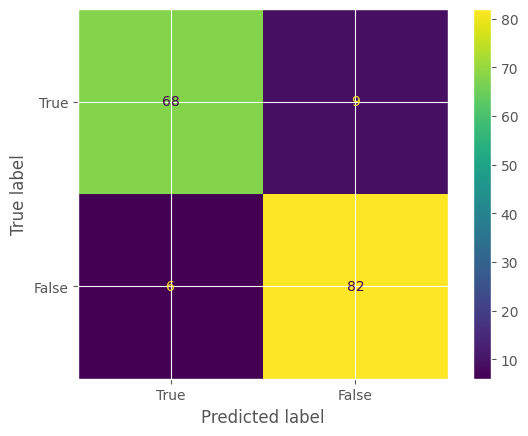

In [199]:
from sklearn.metrics import ConfusionMatrixDisplay, accuracy_score

#Apresentação da Matriz de Confusão
disp = ConfusionMatrixDisplay(confusion_matrix=cmatrix, display_labels= [True, False])
disp.plot()

accuracy_score(y_test, ypred)

In [200]:
#Holdout

model = DecisionTreeClassifier()

scores = []
#Cálculo de Scores Através do Holdout (A informação é partida em duas partes)
for i in range (10):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3)

    clf_Decision_Tree.fit(X_train, y_train)

    y_pred = clf_Decision_Tree.predict(X_test)

    fold_score = accuracy_score(y_test, y_pred)

    scores.append(fold_score)

mean_accuracy = np.mean(scores)
std_accuracy = np.std(scores)
print("Holdout Scores:", scores)
print("Acurácia Méida:", mean_accuracy)
print("Desvio Padrão:", std_accuracy)

Holdout Scores: [0.88801261829653, 0.8454258675078864, 0.8438485804416404, 0.8406940063091483, 0.8391167192429022, 0.8659305993690851, 0.8517350157728707, 0.9022082018927445, 0.8753943217665615, 0.8501577287066246]
Acurácia Méida: 0.8602523659305994
Desvio Padrão: 0.020700352954603065


In [201]:
#K-Fold

#Cálculo de Scores através de K-Fold (A informação é partida em k partes)
def kfold_indices(data, k):
    fold_size = len(data) // k
    indices = np.arange(len(data))
    folds = []
    for i in range (k):
        test_indices = indices[i * fold_size : (i + 1) * fold_size]
        train_indices = np.concatenate([indices[:i * fold_size], indices[(i + 1) * fold_size:]])
        folds.append((train_indices, test_indices))
    return folds

k = 5

fold_indices = kfold_indices(X, k)

In [202]:
model = DecisionTreeClassifier()

scores = []
prevs_folds = []
y_folds = []

#Isto não está a funcionar

#for train_indices, test_indices in fold_indices:
#    X_train, y_train = X[train_indices], y[train_indices]
#    X_test, y_test = X[test_indices], y[test_indices]

#    clf_Decision_Tree.fit(X_train, y_train)

#    y_pred = clf_Decision_Tree.predict(X_test)

#    fold_score = accuracy_score(y_test, y_pred)

#    scores.append(fold_score)

#    prevs_folds.append(y_pred)
#    y_folds.append(y_test)


# SVM

In [203]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn import svm, metrics
from sklearn.model_selection import train_test_split

#Criação do Modelo de SVM com os vários kernels
for kernel in ['linear', 'poly', 'rbf', 'sigmoid']:

    #O gama define qual é a influência máxima que um exemplo de treino consegue alcançar
    #Uso de gamma = auto representa o uso de 1/n_features
    model = svm.SVC(kernel = kernel, gamma = 'auto')
    model.fit(X_train, y_train)

    #Predict de resultados através do Modelo SVC com uso de Kernel Atual
    y_pred_test = model.predict(X_test)

    #Dados de Acurácia (cv = 7, representa divisão dos dados em 7 grupos)
    #CV = 7 representa 6 partes de treino e 1 de teste
    scores = cross_val_score(model, X, y, cv = 7, scoring= 'accuracy')

    if kernel == "linear":
        scores_SVM_Linear = scores
    
    if kernel == "poly":
        scores_SVM_Poly = scores
    
    if kernel == "rbf":
        scores_SVM_Rbf = scores
    
    if kernel == "sigmoid":
        scores_SVM_Sigmoid = scores

    print("\nScores: ", scores)
    print(f"\nKernel: {kernel}, Acurácia Média: {scores.mean()}")
    print(f"Kernel: {kernel}, Desvio Médio da Acurácia: {scores.std()}")


    meanAbErrTrain = metrics.mean_absolute_error(y_train, model.predict(X_train))
    meanSqErrTrain = metrics.mean_squared_error(y_train, model.predict(X_train))

    meanAbErrTest = metrics.mean_absolute_error(y_test, y_pred_test)
    meanSqErrTest = metrics.mean_squared_error(y_test, y_pred_test)


    print("\nTrain - Mean Absolute Error: ", meanAbErrTrain)
    print("Train - Mean Squared Error:", meanSqErrTrain)
    print("\nTest - Mean Absolute Error:", meanAbErrTest)
    print("Test- Mean Squared Error", meanSqErrTest)

#Guardar valores para posterior comparação. Guardamos os valores do kernel Linear para representar o SVM pois obteve os melhores resultados 
mean_accuracy_SVM = scores_SVM_Linear.mean()
std_accuracy_SVM = scores_SVM_Linear.std()
scores_svm = scores_SVM_Linear

#Guardar Dados Recall
scores_recall_SVM = cross_val_score(model, X, y, cv=7, scoring='recall_weighted')

#Guardar Dados Precision
scores_precision_SVM = cross_val_score(model, X, y, cv=7, scoring='precision_weighted')

#Guardar Dados F1
scores_F1_SVM = cross_val_score(model, X, y, cv=7, scoring='f1_weighted')


recall_SVM = scores_recall_SVM.mean()
precision_SVM = scores_precision_SVM.mean()
f1_SVM = scores_F1_SVM.mean()

print("\nAcurácia Média: ", mean_accuracy_SVM)
print("Desvio padrão:", std_accuracy_SVM)
print("Recall:", recall_SVM)
print("Precision:", precision_SVM)
print("F1:", f1_SVM)



Scores:  [0.67880795 0.79470199 0.84768212 0.86423841 0.88039867 0.85714286
 0.54152824]

Kernel: linear, Acurácia Média: 0.7806428901454313
Kernel: linear, Desvio Médio da Acurácia: 0.11651472021682106

Train - Mean Absolute Error:  0.7874069058903183
Train - Mean Squared Error: 4.706161137440758

Test - Mean Absolute Error: 0.9290220820189274
Test- Mean Squared Error 5.771293375394322

Scores:  [0.43377483 0.56953642 0.56291391 0.56953642 0.55813953 0.55149502
 0.34883721]

Kernel: poly, Acurácia Média: 0.5134619071716165
Kernel: poly, Desvio Médio da Acurácia: 0.08073601753846574

Train - Mean Absolute Error:  2.3683141503046716
Train - Mean Squared Error: 13.773865944482058

Test - Mean Absolute Error: 2.3817034700315456
Test- Mean Squared Error 13.917981072555206

Scores:  [0.52649007 0.67549669 0.70529801 0.73509934 0.74086379 0.68438538
 0.42192691]

Kernel: rbf, Acurácia Média: 0.6413657408134977
Kernel: rbf, Desvio Médio da Acurácia: 0.11157228023084728

Train - Mean Absolute

c:\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Python311\Lib\site-packages\sklearn\metrics\_clas


Acurácia Média:  0.7806428901454313
Desvio padrão: 0.11651472021682106
Recall: 0.5290972695870277
Precision: 0.5034414046781116
F1: 0.48438484719790226


# Redes Neuronais

In [204]:
import tensorflow as tf
tf.random.set_seed(42)

from tensorflow import keras
from keras import backend



In [205]:
#Criação da Rede Neuronal
#Camada de Entrada com 16 Neurónios = Numero de Colunas do DataSet
#Camada Oculta com 1 Neurónio
#Camada De saída com 9 Neurónios = Quantidade de Labels de Label Existentes

#Iremos utilizar a função de ativação "softmax" por ser a mais ajustada para a classificação
rede_neuronal_1 = keras.Sequential([
    keras.layers.Flatten(input_shape =(16,)),
    keras.layers.Dense(1, activation='relu'),
    keras.layers.Dense(9, activation='softmax')
])

c:\Python311\Lib\site-packages\keras\src\layers\reshaping\flatten.py:37: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



In [206]:
#Compilar Rede Neuronal
rede_neuronal_1.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics= ['accuracy'])

In [207]:
#Sumário da Rede Neuronal
print(rede_neuronal_1.summary())

Model: "sequential_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_15 (Flatten)            │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_42 (Dense)                │ (None, 1)              │            17 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_43 (Dense)                │ (None, 9)              │            18 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 35 (140.00 B)

 Trainable params: 35 (140.00 B)

 Non-trainable params: 0 (0.00 B)

None


In [208]:
# Avaliação do modelo segundo o método de k-fold cross validation

# Número de Repetições (Folds)
num_folds = 7

# Definição da Varíavel de Cruzamento
kfold = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=42)

acc_per_fold = []
loss_per_fold = []
recall_per_fold = []
precision_per_fold = []
f1_per_fold = []

for train, test in kfold.split(X_train, y_train):

    # Treino da Rede Neuronal
    history = rede_neuronal_1.fit(X_train, y_train, validation_split=0.1, epochs=30)
    
    # Avaliaçáo da rede segundo a acurácia
    scores = rede_neuronal_1.evaluate(X_train, y_train, verbose=0)
    loss_per_fold.append(scores[0])
    acc_per_fold.append(scores[1])

    # Predict do Modelo de Rede Neuronal
    y_pred = rede_neuronal_1.predict(X_test)
    # Conversão de probabilidades em classes
    y_pred_classes = [np.argmax(element) for element in y_pred]
    
    #Recall
    recall_per_fold.append(recall_score(y_test, y_pred_classes, average='weighted'))

    #Precision
    precision_per_fold.append(precision_score(y_test, y_pred_classes, average='weighted'))

    #F1
    f1_per_fold.append(f1_score(y_test, y_pred_classes, average='weighted'))
    
#Guardar valores para posterior comparação
mean_accuracy_rede_1 = np.mean(acc_per_fold)

std_accuracy_rede_1 = np.std(acc_per_fold)

scores_rede_1 = acc_per_fold

precision_rede_1 = np.mean(precision_per_fold)

recall_rede_1 = np.mean(recall_per_fold)

f1_rede_1 = np.mean(f1_per_fold)

print(f"Acurácia média: {mean_accuracy_rede_1}")
print(f"Desvio padrão: {std_accuracy_rede_1}")
print(f"Scores: {scores_rede_1}")
print(f"Loss médio: {np.mean(loss_per_fold)} (+- {np.std(loss_per_fold)})")

Epoch 1/30


c:\Python311\Lib\site-packages\sklearn\model_selection\_split.py:776: UserWarning:

The least populated class in y has only 6 members, which is less than n_splits=7.



42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.1176 - loss: 2.2178 - val_accuracy: 0.1486 - val_loss: 2.1817
Epoch 2/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1676 - loss: 2.1888 - val_accuracy: 0.1554 - val_loss: 2.1617
Epoch 3/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1301 - loss: 2.1713 - val_accuracy: 0.1351 - val_loss: 2.1462
Epoch 4/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1255 - loss: 2.1575 - val_accuracy: 0.1622 - val_loss: 2.1330
Epoch 5/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1432 - loss: 2.1455 - val_accuracy: 0.1892 - val_loss: 2.1206
Epoch 6/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1539 - loss: 2.1344 - val_accuracy: 0.2027 - val_loss: 2.1084
Epoch 7/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1570 - loss: 2.1237 - val_accuracy: 0.2095 - val_loss: 2.0958
Epoch 8/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1610 - loss: 2.1129 - val_accuracy: 0.2095 - val_loss: 2.0820
Epo

c:\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



Epoch 3/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2869 - loss: 1.8492 - val_accuracy: 0.2905 - val_loss: 1.8115
Epoch 4/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2856 - loss: 1.8430 - val_accuracy: 0.2905 - val_loss: 1.8074
Epoch 5/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2858 - loss: 1.8372 - val_accuracy: 0.2905 - val_loss: 1.8036
Epoch 6/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2855 - loss: 1.8317 - val_accuracy: 0.2905 - val_loss: 1.8001
Epoch 7/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2845 - loss: 1.8265 - val_accuracy: 0.2905 - val_loss: 1.7969
Epoch 8/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2827 - loss: 1.8216 - val_accuracy: 0.2973 - val_loss: 1.7936
Epoch 9/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2842 - loss: 1.8168 - val_accuracy: 0.2973 - val_loss: 1.7906
Epoch 10/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2843 - loss: 1.8122 - val_accuracy: 0.2973 - val_loss

c:\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3085 - loss: 1.7504 - val_accuracy: 0.3108 - val_loss: 1.7528
Epoch 3/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3086 - loss: 1.7487 - val_accuracy: 0.3108 - val_loss: 1.7519
Epoch 4/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3089 - loss: 1.7471 - val_accuracy: 0.3176 - val_loss: 1.7510
Epoch 5/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3089 - loss: 1.7455 - val_accuracy: 0.3176 - val_loss: 1.7503
Epoch 6/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3089 - loss: 1.7440 - val_accuracy: 0.3176 - val_loss: 1.7495
Epoch 7/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3089 - loss: 1.7427 - val_accuracy: 0.3176 - val_loss: 1.7491
Epoch 8/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3089 - loss: 1.7414 - val_accuracy: 0.3243 - val_loss: 1.7488
Epoch 9/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3084 - loss: 1.7402 - val_accuracy: 0.3243 - val_loss: 1.7483
Epo

c:\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3090 - loss: 1.7178 - val_accuracy: 0.3243 - val_loss: 1.7361
Epoch 3/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3090 - loss: 1.7171 - val_accuracy: 0.3243 - val_loss: 1.7357
Epoch 4/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3081 - loss: 1.7164 - val_accuracy: 0.3243 - val_loss: 1.7354
Epoch 5/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3079 - loss: 1.7158 - val_accuracy: 0.3243 - val_loss: 1.7352
Epoch 6/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3079 - loss: 1.7151 - val_accuracy: 0.3243 - val_loss: 1.7348
Epoch 7/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3107 - loss: 1.7146 - val_accuracy: 0.3243 - val_loss: 1.7345
Epoch 8/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3112 - loss: 1.7141 - val_accuracy: 0.3243 - val_loss: 1.7342
Epoch 9/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3103 - loss: 1.7135 - val_accuracy: 0.3243 - val_loss: 1.7340
Epo

c:\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



Epoch 3/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3113 - loss: 1.7034 - val_accuracy: 0.3311 - val_loss: 1.7292
Epoch 4/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3118 - loss: 1.7030 - val_accuracy: 0.3311 - val_loss: 1.7291
Epoch 5/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3118 - loss: 1.7027 - val_accuracy: 0.3311 - val_loss: 1.7290
Epoch 6/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3118 - loss: 1.7024 - val_accuracy: 0.3311 - val_loss: 1.7288
Epoch 7/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3125 - loss: 1.7021 - val_accuracy: 0.3311 - val_loss: 1.7286
Epoch 8/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3126 - loss: 1.7017 - val_accuracy: 0.3311 - val_loss: 1.7285
Epoch 9/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3126 - loss: 1.7014 - val_accuracy: 0.3311 - val_loss: 1.7283
Epoch 10/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3122 - loss: 1.7011 - val_accuracy: 0.3311 - val_loss

c:\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3174 - loss: 1.6954 - val_accuracy: 0.3378 - val_loss: 1.7258
Epoch 3/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3168 - loss: 1.6952 - val_accuracy: 0.3378 - val_loss: 1.7257
Epoch 4/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3168 - loss: 1.6949 - val_accuracy: 0.3378 - val_loss: 1.7256
Epoch 5/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3179 - loss: 1.6948 - val_accuracy: 0.3311 - val_loss: 1.7255
Epoch 6/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3179 - loss: 1.6946 - val_accuracy: 0.3311 - val_loss: 1.7255
Epoch 7/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3196 - loss: 1.6944 - val_accuracy: 0.3311 - val_loss: 1.7254
Epoch 8/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3184 - loss: 1.6941 - val_accuracy: 0.3311 - val_loss: 1.7254
Epoch 9/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3184 - loss: 1.6939 - val_accuracy: 0.3311 - val_loss: 1.7253
Epo

c:\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



Epoch 3/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3134 - loss: 1.6894 - val_accuracy: 0.3378 - val_loss: 1.7236
Epoch 4/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3149 - loss: 1.6892 - val_accuracy: 0.3378 - val_loss: 1.7236
Epoch 5/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3150 - loss: 1.6891 - val_accuracy: 0.3378 - val_loss: 1.7235
Epoch 6/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3156 - loss: 1.6889 - val_accuracy: 0.3378 - val_loss: 1.7235
Epoch 7/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3182 - loss: 1.6888 - val_accuracy: 0.3378 - val_loss: 1.7234
Epoch 8/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3182 - loss: 1.6886 - val_accuracy: 0.3378 - val_loss: 1.7234
Epoch 9/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3192 - loss: 1.6885 - val_accuracy: 0.3378 - val_loss: 1.7233
Epoch 10/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3195 - loss: 1.6884 - val_accuracy: 0.3311 - val_loss

c:\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [209]:
#Para esta rede neuronal adicionamos mais 1 camada com 15 neurónios
rede_neuronal_2 = keras.Sequential([
    keras.layers.Flatten(input_shape =(16,)),
    keras.layers.Dense(1, activation='relu'),
    keras.layers.Dense(15, activation='relu'),
    keras.layers.Dense(9, activation='softmax')
])

c:\Python311\Lib\site-packages\keras\src\layers\reshaping\flatten.py:37: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



In [210]:
#Compilar Rede Neuronal
rede_neuronal_2.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics= ['accuracy'])

In [211]:
#Sumário da Rede Neuronal
print(rede_neuronal_2.summary())

Model: "sequential_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_16 (Flatten)            │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_44 (Dense)                │ (None, 1)              │            17 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_45 (Dense)                │ (None, 15)             │            30 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_46 (Dense)                │ (None, 9)              │           144 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 191 (764.00 B)

 Trainable params: 191 (764.00 B)

 Non-trainable params: 0 (0.00 B)

None


In [212]:
rede_neuronal_2.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics= ['accuracy'])

In [213]:
print(rede_neuronal_2.summary())

Model: "sequential_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_16 (Flatten)            │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_44 (Dense)                │ (None, 1)              │            17 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_45 (Dense)                │ (None, 15)             │            30 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_46 (Dense)                │ (None, 9)              │           144 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 191 (764.00 B)

 Trainable params: 191 (764.00 B)

 Non-trainable params: 0 (0.00 B)

None


In [214]:
# Avaliação do modelo segundo o método de k-fold cross validation

# Número de Repetições (Folds)
num_folds = 7

# Definição da Varíavel de Cruzamento
kfold = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=42)

acc_per_fold = []
loss_per_fold = []
recall_per_fold = []
precision_per_fold = []
f1_per_fold = []

for train, test in kfold.split(X_train, y_train):

    # Treino da Rede Neuronal
    history = rede_neuronal_2.fit(X_train, y_train, validation_split=0.1, epochs=30)
    
    # Avaliaçáo da rede segundo a acurácia
    scores = rede_neuronal_2.evaluate(X_train, y_train, verbose=0)
    loss_per_fold.append(scores[0])
    acc_per_fold.append(scores[1])

    # Predict do Modelo de Rede Neuronal
    y_pred = rede_neuronal_2.predict(X_test)
    # Conversão de probabilidades em classes
    y_pred_classes = [np.argmax(element) for element in y_pred]
    
    #Recall
    recall_per_fold.append(recall_score(y_test, y_pred_classes, average='weighted'))

    #Precision
    precision_per_fold.append(precision_score(y_test, y_pred_classes, average='weighted'))

    #F1
    f1_per_fold.append(f1_score(y_test, y_pred_classes, average='weighted'))
    
#Guardar valores para posterior comparação
mean_accuracy_rede_2 = np.mean(acc_per_fold)

std_accuracy_rede_2 = np.std(acc_per_fold)

scores_rede_2 = acc_per_fold

precision_rede_2 = np.mean(precision_per_fold)

recall_rede_2 = np.mean(recall_per_fold)

f1_rede_2 = np.mean(f1_per_fold)

print(f"Acurácia média: {mean_accuracy_rede_2}")
print(f"Desvio padrão: {std_accuracy_rede_2}")
print(f"Scores: {scores_rede_2}")
print(f"Loss médio: {np.mean(loss_per_fold)} (+- {np.std(loss_per_fold)})")

Epoch 1/30


c:\Python311\Lib\site-packages\sklearn\model_selection\_split.py:776: UserWarning:

The least populated class in y has only 6 members, which is less than n_splits=7.



42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.1073 - loss: 2.2094 - val_accuracy: 0.1014 - val_loss: 2.1864
Epoch 2/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1363 - loss: 2.1831 - val_accuracy: 0.1149 - val_loss: 2.1665
Epoch 3/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1398 - loss: 2.1646 - val_accuracy: 0.1081 - val_loss: 2.1475
Epoch 4/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1404 - loss: 2.1452 - val_accuracy: 0.1014 - val_loss: 2.1247
Epoch 5/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1386 - loss: 2.1215 - val_accuracy: 0.1014 - val_loss: 2.0953
Epoch 6/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1372 - loss: 2.0910 - val_accuracy: 0.1014 - val_loss: 2.0595
Epoch 7/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1356 - loss: 2.0567 - val_accuracy: 0.1081 - val_loss: 2.0250
Epoch 8/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1371 - loss: 2.0270 - val_accuracy: 0.1419 - val_loss: 1.9991
Epo

c:\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2506 - loss: 1.7976 - val_accuracy: 0.2027 - val_loss: 1.8100
Epoch 3/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2557 - loss: 1.7816 - val_accuracy: 0.2027 - val_loss: 1.7967
Epoch 4/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2617 - loss: 1.7658 - val_accuracy: 0.2027 - val_loss: 1.7833
Epoch 5/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2657 - loss: 1.7501 - val_accuracy: 0.1959 - val_loss: 1.7697
Epoch 6/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2742 - loss: 1.7345 - val_accuracy: 0.2095 - val_loss: 1.7562
Epoch 7/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2778 - loss: 1.7189 - val_accuracy: 0.2230 - val_loss: 1.7428
Epoch 8/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2868 - loss: 1.7034 - val_accuracy: 0.2432 - val_loss: 1.7294
Epoch 9/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.3071 - loss: 1.6880 - val_accuracy: 0.2770 - val_loss: 1.7159
Epo

c:\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4785 - loss: 1.3837 - val_accuracy: 0.4865 - val_loss: 1.4211
Epoch 3/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4853 - loss: 1.3722 - val_accuracy: 0.4932 - val_loss: 1.4089
Epoch 4/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4881 - loss: 1.3610 - val_accuracy: 0.5000 - val_loss: 1.3970
Epoch 5/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4947 - loss: 1.3497 - val_accuracy: 0.5135 - val_loss: 1.3851
Epoch 6/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5021 - loss: 1.3386 - val_accuracy: 0.5135 - val_loss: 1.3734
Epoch 7/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5112 - loss: 1.3276 - val_accuracy: 0.5270 - val_loss: 1.3618
Epoch 8/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5211 - loss: 1.3167 - val_accuracy: 0.5473 - val_loss: 1.3504
Epoch 9/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5386 - loss: 1.3059 - val_accuracy: 0.5608 - val_loss: 1.3389
Epo

c:\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6389 - loss: 1.0818 - val_accuracy: 0.6419 - val_loss: 1.0976
Epoch 3/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6402 - loss: 1.0732 - val_accuracy: 0.6419 - val_loss: 1.0882
Epoch 4/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6410 - loss: 1.0647 - val_accuracy: 0.6419 - val_loss: 1.0790
Epoch 5/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6414 - loss: 1.0562 - val_accuracy: 0.6419 - val_loss: 1.0700
Epoch 6/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6426 - loss: 1.0480 - val_accuracy: 0.6486 - val_loss: 1.0611
Epoch 7/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6436 - loss: 1.0398 - val_accuracy: 0.6486 - val_loss: 1.0523
Epoch 8/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6453 - loss: 1.0317 - val_accuracy: 0.6622 - val_loss: 1.0436
Epoch 9/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6486 - loss: 1.0237 - val_accuracy: 0.6622 - val_loss: 1.0351
Epo

c:\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



Epoch 3/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7533 - loss: 0.8671 - val_accuracy: 0.7973 - val_loss: 0.8697
Epoch 4/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7531 - loss: 0.8619 - val_accuracy: 0.7973 - val_loss: 0.8641
Epoch 5/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7542 - loss: 0.8567 - val_accuracy: 0.7973 - val_loss: 0.8586
Epoch 6/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7522 - loss: 0.8516 - val_accuracy: 0.7973 - val_loss: 0.8532
Epoch 7/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7536 - loss: 0.8466 - val_accuracy: 0.7973 - val_loss: 0.8479
Epoch 8/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7604 - loss: 0.8416 - val_accuracy: 0.7973 - val_loss: 0.8427
Epoch 9/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7620 - loss: 0.8367 - val_accuracy: 0.8041 - val_loss: 0.8375
Epoch 10/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7661 - loss: 0.8318 - val_accuracy: 0.8041 - val_loss

c:\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



Epoch 3/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7962 - loss: 0.7407 - val_accuracy: 0.7973 - val_loss: 0.7363
Epoch 4/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7963 - loss: 0.7375 - val_accuracy: 0.7973 - val_loss: 0.7329
Epoch 5/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7967 - loss: 0.7342 - val_accuracy: 0.7973 - val_loss: 0.7295
Epoch 6/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7974 - loss: 0.7310 - val_accuracy: 0.7973 - val_loss: 0.7262
Epoch 7/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7974 - loss: 0.7278 - val_accuracy: 0.7973 - val_loss: 0.7228
Epoch 8/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7973 - loss: 0.7247 - val_accuracy: 0.7973 - val_loss: 0.7197
Epoch 9/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7996 - loss: 0.7218 - val_accuracy: 0.7973 - val_loss: 0.7165
Epoch 10/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8014 - loss: 0.7188 - val_accuracy: 0.7973 - val_loss

c:\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7997 - loss: 0.6624 - val_accuracy: 0.8311 - val_loss: 0.6538
Epoch 3/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7997 - loss: 0.6603 - val_accuracy: 0.8311 - val_loss: 0.6515
Epoch 4/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8027 - loss: 0.6582 - val_accuracy: 0.8311 - val_loss: 0.6493
Epoch 5/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8044 - loss: 0.6561 - val_accuracy: 0.8311 - val_loss: 0.6471
Epoch 6/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8043 - loss: 0.6540 - val_accuracy: 0.8311 - val_loss: 0.6449
Epoch 7/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8087 - loss: 0.6519 - val_accuracy: 0.8311 - val_loss: 0.6428
Epoch 8/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8092 - loss: 0.6499 - val_accuracy: 0.8311 - val_loss: 0.6407
Epoch 9/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8081 - loss: 0.6479 - val_accuracy: 0.8311 - val_loss: 0.6386
Epo

c:\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [215]:
#Para esta rede neuronal na camada de entrada teremos 25 neurónios
rede_neuronal_3 = keras.Sequential([
    keras.layers.Flatten(input_shape =(16,)),
    keras.layers.Dense(25, activation='relu'),
    keras.layers.Dense(15, activation='relu'),
    keras.layers.Dense(9, activation='softmax')
])

c:\Python311\Lib\site-packages\keras\src\layers\reshaping\flatten.py:37: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



In [216]:
#Compilar Rede Neuronal
rede_neuronal_3.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics= ['accuracy'])

In [217]:
#Sumário da Rede Neuronal
print(rede_neuronal_3.summary())

Model: "sequential_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_17 (Flatten)            │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_47 (Dense)                │ (None, 25)             │           425 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_48 (Dense)                │ (None, 15)             │           390 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_49 (Dense)                │ (None, 9)              │           144 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 959 (3.75 KB)

 Trainable params: 959 (3.75 KB)

 Non-trainable params: 0 (0.00 B)

None


In [218]:
# Avaliação do modelo segundo o método de k-fold cross validation

# Número de Repetições (Folds)
num_folds = 7

# Definição da Varíavel de Cruzamento
kfold = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=42)

acc_per_fold = []
loss_per_fold = []
recall_per_fold = []
precision_per_fold = []
f1_per_fold = []

for train, test in kfold.split(X_train, y_train):

    # Treino da Rede Neuronal
    history = rede_neuronal_3.fit(X_train, y_train, validation_split=0.1, epochs=30)
    
    # Avaliaçáo da rede segundo a acurácia
    scores = rede_neuronal_3.evaluate(X_train, y_train, verbose=0)
    loss_per_fold.append(scores[0])
    acc_per_fold.append(scores[1])

    # Predict do Modelo de Rede Neuronal
    y_pred = rede_neuronal_3.predict(X_test)
    # Conversão de probabilidades em classes
    y_pred_classes = [np.argmax(element) for element in y_pred]
    
    #Recall
    recall_per_fold.append(recall_score(y_test, y_pred_classes, average='weighted'))

    #Precision
    precision_per_fold.append(precision_score(y_test, y_pred_classes, average='weighted'))

    #F1
    f1_per_fold.append(f1_score(y_test, y_pred_classes, average='weighted'))
    
#Guardar valores para posterior comparação
mean_accuracy_rede_3 = np.mean(acc_per_fold)

std_accuracy_rede_3 = np.std(acc_per_fold)

scores_rede_3 = acc_per_fold

precision_rede_3 = np.mean(precision_per_fold)

recall_rede_3 = np.mean(recall_per_fold)

f1_rede_3 = np.mean(f1_per_fold)

print(f"Acurácia média: {mean_accuracy_rede_3}")
print(f"Desvio padrão: {std_accuracy_rede_3}")
print(f"Scores: {scores_rede_3}")
print(f"Loss médio: {np.mean(loss_per_fold)} (+- {np.std(loss_per_fold)})")

Epoch 1/30


c:\Python311\Lib\site-packages\sklearn\model_selection\_split.py:776: UserWarning:

The least populated class in y has only 6 members, which is less than n_splits=7.



42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.1063 - loss: 2.1864 - val_accuracy: 0.2500 - val_loss: 2.0915
Epoch 2/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2884 - loss: 2.0532 - val_accuracy: 0.3446 - val_loss: 1.9552
Epoch 3/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3970 - loss: 1.9034 - val_accuracy: 0.3514 - val_loss: 1.8396
Epoch 4/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4054 - loss: 1.7704 - val_accuracy: 0.3446 - val_loss: 1.7467
Epoch 5/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4329 - loss: 1.6557 - val_accuracy: 0.3986 - val_loss: 1.6552
Epoch 6/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4901 - loss: 1.5406 - val_accuracy: 0.4189 - val_loss: 1.5609
Epoch 7/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5172 - loss: 1.4294 - val_accuracy: 0.4324 - val_loss: 1.4731
Epoch 8/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5398 - loss: 1.3343 - val_accuracy: 0.4730 - val_loss: 1.3932
Epo

c:\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.7989 - loss: 0.6317 - val_accuracy: 0.7838 - val_loss: 0.6753
Epoch 2/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8024 - loss: 0.6198 - val_accuracy: 0.7838 - val_loss: 0.6623
Epoch 3/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8072 - loss: 0.6086 - val_accuracy: 0.7838 - val_loss: 0.6499
Epoch 4/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8047 - loss: 0.5980 - val_accuracy: 0.7838 - val_loss: 0.6381
Epoch 5/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8109 - loss: 0.5879 - val_accuracy: 0.7838 - val_loss: 0.6273
Epoch 6/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8129 - loss: 0.5784 - val_accuracy: 0.7905 - val_loss: 0.6169
Epoch 7/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8173 - loss: 0.5693 - val_accuracy: 0.7973 - val_loss: 0.6072
Epoch 8/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8204 - loss: 0.5607 - val_accuracy: 0.7973 - val_loss: 0.5979
Ep

c:\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8529 - loss: 0.4258 - val_accuracy: 0.7973 - val_loss: 0.4618
Epoch 3/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8535 - loss: 0.4220 - val_accuracy: 0.7973 - val_loss: 0.4584
Epoch 4/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8565 - loss: 0.4184 - val_accuracy: 0.7973 - val_loss: 0.4549
Epoch 5/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8564 - loss: 0.4148 - val_accuracy: 0.8108 - val_loss: 0.4517
Epoch 6/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8613 - loss: 0.4113 - val_accuracy: 0.8041 - val_loss: 0.4484
Epoch 7/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8615 - loss: 0.4079 - val_accuracy: 0.8108 - val_loss: 0.4451
Epoch 8/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8626 - loss: 0.4046 - val_accuracy: 0.8108 - val_loss: 0.4421
Epoch 9/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8631 - loss: 0.4014 - val_accuracy: 0.8108 - val_loss: 0.4391
Epo

c:\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8883 - loss: 0.3440 - val_accuracy: 0.8378 - val_loss: 0.3921
Epoch 3/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8901 - loss: 0.3422 - val_accuracy: 0.8378 - val_loss: 0.3903
Epoch 4/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8894 - loss: 0.3401 - val_accuracy: 0.8378 - val_loss: 0.3892
Epoch 5/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8897 - loss: 0.3384 - val_accuracy: 0.8378 - val_loss: 0.3880
Epoch 6/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8897 - loss: 0.3366 - val_accuracy: 0.8378 - val_loss: 0.3870
Epoch 7/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8898 - loss: 0.3349 - val_accuracy: 0.8378 - val_loss: 0.3860
Epoch 8/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8900 - loss: 0.3331 - val_accuracy: 0.8378 - val_loss: 0.3849
Epoch 9/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8900 - loss: 0.3314 - val_accuracy: 0.8378 - val_loss: 0.3840
Epo

In [219]:
# Comparação entre resultados das Redes Neuronais
resultados_redes = pd.DataFrame({
    "Modelo": ["Rede Neuronal 1", "Rede Neuronal 2", "Rede Neuronal 3"],
    "Acurácia Média": [mean_accuracy_rede_1, mean_accuracy_rede_2, mean_accuracy_rede_3],
    "Desvio Padrão": [std_accuracy_rede_1, std_accuracy_rede_2, std_accuracy_rede_3],
    "Recall": [recall_rede_1, recall_rede_2, recall_rede_3],
    "Precision": [precision_rede_1, precision_rede_2, precision_rede_3],
    "F1": [f1_rede_1, f1_rede_2, f1_rede_3]
})

# Mostrar Resultados
print("\n")
print(resultados_redes.to_string(index=False))



         Modelo  Acurácia Média  Desvio Padrão   Recall  Precision       F1
Rede Neuronal 1        0.318019       0.013428 0.310275   0.175198 0.207626
Rede Neuronal 2        0.647065       0.206209 0.612213   0.561899 0.565732
Rede Neuronal 3        0.880453       0.039452 0.838441   0.832279 0.832935


In [220]:
# Escolher e guardar o melhor modelo de Rede Neuronal
mean_accuracy_rede_neuronal = mean_accuracy_rede_3
std_accuracy_rede_neuronal = std_accuracy_rede_3
scores_rede_neuronal = scores_rede_3
precision_rede_neuronal = precision_rede_3
recall_rede_neuronal = recall_rede_3
f1_rede_neuronal = f1_rede_3

# K-vizinhos-mais-próximos

In [221]:
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, r2_score

rmse_val = []
k_list = []
kmax = 50
kstep = 2

for K in range(1, kmax, kstep):
    model = KNeighborsRegressor(n_neighbors= K)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    error = np.sqrt(mean_squared_error(y_test, y_pred))
    rmse_val.append(error)
    k_list.append(K)

    print("RMSE para k = ", K, ':', error)


min_rmse = min(rmse_val)

best_k = k_list[rmse_val.index(min_rmse)]
print("Melhor K: ", best_k)
print("RMSE: ", min_rmse)

RMSE para k =  1 : 2.5364845639620333
RMSE para k =  3 : 2.3126998165867483
RMSE para k =  5 : 2.2771945770960893
RMSE para k =  7 : 2.3141747173488847
RMSE para k =  9 : 2.339496641996587
RMSE para k =  11 : 2.362698629364796
RMSE para k =  13 : 2.3879574391807212
RMSE para k =  15 : 2.3938758175965615
RMSE para k =  17 : 2.385408764796357
RMSE para k =  19 : 2.4067934006973926
RMSE para k =  21 : 2.411197414761728
RMSE para k =  23 : 2.4222446935249957
RMSE para k =  25 : 2.435438669766821
RMSE para k =  27 : 2.4500805983480265
RMSE para k =  29 : 2.45636648601383
RMSE para k =  31 : 2.4658142186232217
RMSE para k =  33 : 2.473018650676271
RMSE para k =  35 : 2.4829456280442104
RMSE para k =  37 : 2.4936688941954133
RMSE para k =  39 : 2.4960715322764866
RMSE para k =  41 : 2.5094355014982987
RMSE para k =  43 : 2.511118055941336
RMSE para k =  45 : 2.5180737805162767
RMSE para k =  47 : 2.5246764658952885
RMSE para k =  49 : 2.5260183411341526
Melhor K:  5
RMSE:  2.2771945770960893


In [222]:
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns

curve = pd.DataFrame(rmse_val)

fig = px.line(curve, x= k_list, y= curve[0], title = "Valores RMSE vs valores de k", )

fig.show()

In [223]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

accuracy_list = []
k_list = []
k_max = 50
kstep = 2

for K in range (1, kmax, kstep):
    model = KNeighborsClassifier(n_neighbors=K)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    acc = accuracy_score(y_test, y_pred)
    accuracy_list.append(acc)
    k_list.append(K)

    print('Accuracy para K = ', K, ':', acc)


best_acc = max(accuracy_list)
best_k = k_list[accuracy_list.index(best_acc)]

print("Melhor K: ", best_k)
print("Melhor Acurácia: ", best_acc)

Accuracy para K =  1 : 0.7334384858044164
Accuracy para K =  3 : 0.7082018927444795
Accuracy para K =  5 : 0.7066246056782335
Accuracy para K =  7 : 0.6782334384858044
Accuracy para K =  9 : 0.6735015772870663
Accuracy para K =  11 : 0.6577287066246057
Accuracy para K =  13 : 0.6482649842271293
Accuracy para K =  15 : 0.6466876971608833
Accuracy para K =  17 : 0.6356466876971609
Accuracy para K =  19 : 0.6261829652996845
Accuracy para K =  21 : 0.6214511041009464
Accuracy para K =  23 : 0.613564668769716
Accuracy para K =  25 : 0.6025236593059937
Accuracy para K =  27 : 0.5962145110410094
Accuracy para K =  29 : 0.5946372239747634
Accuracy para K =  31 : 0.5914826498422713
Accuracy para K =  33 : 0.5946372239747634
Accuracy para K =  35 : 0.5946372239747634
Accuracy para K =  37 : 0.5851735015772871
Accuracy para K =  39 : 0.5757097791798107
Accuracy para K =  41 : 0.5741324921135647
Accuracy para K =  43 : 0.580441640378549
Accuracy para K =  45 : 0.5788643533123028
Accuracy para K = 

In [224]:
curve = pd.DataFrame(accuracy_list)

fig = px.line(curve, x= k_list, y= curve[0], title = "Acurácia vs valores de k", )

fig.show()

In [225]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score

#Criação do Modelo KNN
knn_cv = KNeighborsClassifier(n_neighbors= best_k)

#Obtenção dos scores do teste
scores = cross_val_score(knn_cv, X, y, cv =7, scoring= 'accuracy')

mean_accuracy_Knn = scores.mean()
std_accuracy_Knn = scores.std()
scores_Knn = scores

print(f"Acurácia média: {mean_accuracy_Knn}")
print(f"Desvio padrão: {std_accuracy_Knn}")
print(f"Scores: {scores_Knn}")

# Recall
scores_recall = cross_val_score(knn_cv, X_train, y_train, cv=7, scoring='recall_weighted')
# Precision
scores_precision = cross_val_score(knn_cv, X_train, y_train, cv=7, scoring='precision_weighted')
# F1
scores_f1 = cross_val_score(knn_cv, X_train, y_train, cv=7, scoring='f1_weighted')

#Guardar médias dos scores para posterior comparação
recall_knn = scores_recall.mean()
precision_knn = scores_precision.mean()
f1_knn = scores_f1.mean()


print(f"Recall: {recall_knn}")
print(f"Precision: {precision_knn}")
print(f"F1: {f1_knn}")

Acurácia média: 0.7105501371964157
Desvio padrão: 0.1130508312958074
Scores: [0.52980132 0.77483444 0.76821192 0.79801325 0.7807309  0.78737542
 0.53488372]


c:\Python311\Lib\site-packages\sklearn\model_selection\_split.py:776: UserWarning:

The least populated class in y has only 6 members, which is less than n_splits=7.

c:\Python311\Lib\site-packages\sklearn\model_selection\_split.py:776: UserWarning:

The least populated class in y has only 6 members, which is less than n_splits=7.

c:\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_di

Recall: 0.7224102911306703
Precision: 0.7247002377416896
F1: 0.7181096183328449


# Alinea 1a)

### Verifique se existe diferença significativa no desempenho dos dois melhores modelos obtidos anteriormente (use um nível de significância de 5%). Identifique o modelo que apresenta o melhor desempenho. 

In [226]:
df_comparacao_modelos = pd.DataFrame({
    "Modelo": ["Árvore de Decisão", "SVM", "Redes Neuronais", "KNN"],
    "Acurácia Média": [mean_accuracy_Decision_Tree,mean_accuracy_SVM,mean_accuracy_rede_neuronal,mean_accuracy_Knn],
    "Desvio Padrão": [std_accuracy_Decision_Tree,std_accuracy_SVM,std_accuracy_rede_neuronal,std_accuracy_Knn]
})

# Imprimir tabela
print("\n")
print(df_comparacao_modelos.to_string(index=False))



           Modelo  Acurácia Média  Desvio Padrão
Árvore de Decisão        0.842710       0.102399
              SVM        0.780643       0.116515
  Redes Neuronais        0.880453       0.039452
              KNN        0.710550       0.113051


#### Como é possível observar pelos resultados obtidos, os dois modelos com melhor prestação são as Redes Neuronais e as Árvores de Decisão respetivamente. As Redes Neuronais destacam-se com a melhor Acurácia e com o menor Desvio Padrão

In [227]:
from scipy import stats
# Hipótese nula: as acurácias são iguais
# Hipótese não nula: as acurácias são diferentes

alpha = 0.05

# Teste de hipótese entre Árvore de Decisão e Redes Neuronais
# Utilizamos o ttest_rel pois queremos testar duas médias obtidas pelos modelos para o mesmo dataset
t_stat, p_value = stats.ttest_rel(scores_Decision_Tree, scores_rede_neuronal)
print("t-statistic: ", t_stat)
print(f"p-value: {p_value}")

if p_value < alpha:
    #Caso as acurácias sejam diferentes
    print("Para um nivel de significância de 5% : Rejeita-se a hipótese nula")
else:
    #Caso as acurácias seja iguais
    print("Para um nivel de significância de 5% : Aceita-se a hipótese nula")


t-statistic:  -0.8990159195504521
p-value: 0.4032790368595099
Para um nivel de significância de 5% : Aceita-se a hipótese nula


# Alinea 1b)

### Compare os resultados dos modelos anteriores. Discuta em detalhe qual o modelo que apresentou melhor e pior desempenho de acordo com as seguintes métricas: Accuracy; Sensitivity; Specificity e F1.

In [228]:
df_comparacao_metricas = pd.DataFrame({
    "Modelo": ["Árvores de Decisão", "SVM", "Redes Neuronais", "KNN"],
    "Acurácia Média": [mean_accuracy_Decision_Tree,mean_accuracy_SVM,mean_accuracy_rede_neuronal,mean_accuracy_Knn],
    "Recall": [recall_Decision_Tree,recall_SVM,recall_rede_neuronal,recall_knn],
    "Precision": [precision_Decision_Tree,precision_SVM,precision_rede_neuronal,precision_knn],
    "F1": [f1_Decision_Tree,f1_SVM,f1_rede_neuronal,f1_knn]
})

# Imprimir tabela
print("\n")
print(df_comparacao_metricas.to_string(index=False))



            Modelo  Acurácia Média   Recall  Precision       F1
Árvores de Decisão        0.842710 0.842710   0.851967 0.838941
               SVM        0.780643 0.529097   0.503441 0.484385
   Redes Neuronais        0.880453 0.838441   0.832279 0.832935
               KNN        0.710550 0.722410   0.724700 0.718110


#### Comparação de Métricas:

A acurácia é a proporção de previsões corretas (tanto verdadeiros positivos quanto verdadeiros negativos) em relação ao total de previsões.

A sensibilidade (também conhecida como recall) mede a proporção de verdadeiros positivos que foram corretamente identificados pelo modelo.

A especificidade (também conhecida como precision) mede a proporção de verdadeiros negativos que foram corretamente identificados pelo modelo.

O F1 Score é a média da precisão (precision) e da sensibilidade (recall), oferecendo assim um equilíbrio entre as duas métricas.


> Modelo com Melhor Desempenho : Árvore de Decisão (Melhor Sensibilidade e Precisão) || Redes Neuronais (Melhor Acurácia Média)

> Modelo com Pior Desempenho : KNN (Pior em todos os aspetos)

# Alínea 1c)

#### Seleção de atributos: Os modelos de classificação desenvolvidos podem obter um melhor desempenho se utilizarem apenas alguns dos atributos disponíveis? Avalie esta hipótese realizando uma seleção de atributos, justificando as escolhas realizadas. Pode basear-se no diagrama de correlação obtido anteriormente, para justificar as escolhas efetuadas. 

In [229]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

# Iremos selecionar os 5 melhores atributos, tal como foi feita na Regressão
# A função SelectKBest seleciona os k melhores de acordo com um teste estatístico.
# O teste qui-quadrado (chi2) é um teste estatístico usado principalmente para examinar se duas variáveis ​​categóricas são independentes para influenciar a estatística do teste.
X_alterado = SelectKBest(chi2, k=5).fit_transform(X, y)


# Divsão do conjunto de dados em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X_alterado, y, test_size=0.3, random_state=12)


X_train.shape, X_test.shape

((1477, 5), (634, 5))

#### Árvore de Decisão

In [230]:
clf_Decision_Tree.fit(X_train, y_train)

clf_Decision_Tree_SA = DecisionTreeClassifier(random_state= 42)

clf_Decision_Tree_SA.fit(X_train, y_train)

plt.style.use('ggplot')
plt.figure(figsize=(200, 200))
plot_tree(clf_Decision_Tree_SA, feature_names= list(data.columns), class_names=list(data['Label']),filled=True)


[Text(0.5939813386798273, 0.975, 'Idade <= 0.531\ngini = 0.86\nsamples = 1477\nvalue = [237, 160, 140, 33, 9, 257, 193, 233, 215]\nclass = Peso_Normal'),
 Text(0.3018584207279457, 0.925, 'Idade <= 0.139\ngini = 0.811\nsamples = 979\nvalue = [237, 159, 140, 33, 9, 180, 0, 6, 215]\nclass = Peso_Normal'),
 Text(0.44791987970388647, 0.95, 'True  '),
 Text(0.1173272671190623, 0.875, 'Idade <= 0.092\ngini = 0.629\nsamples = 299\nvalue = [5, 0, 137, 33, 9, 0, 0, 0, 115]\nclass = Peso_Normal'),
 Text(0.04418568784700802, 0.825, 'Idade <= 0.036\ngini = 0.603\nsamples = 182\nvalue = [0, 0, 103, 32, 9, 0, 0, 0, 38]\nclass = Peso_Normal'),
 Text(0.013571869216533004, 0.775, 'Peso <= 0.188\ngini = 0.425\nsamples = 60\nvalue = [0, 0, 44, 11, 3, 0, 0, 0, 2]\nclass = Peso_Normal'),
 Text(0.011104256631708822, 0.725, 'gini = 0.0\nsamples = 5\nvalue = [0, 0, 0, 5, 0, 0, 0, 0, 0]\nclass = Excesso_Peso_Grau_I'),
 Text(0.016039481801357187, 0.725, 'Idade <= 0.019\ngini = 0.344\nsamples = 55\nvalue = [0, 0,

In [231]:
y_pred = clf_Decision_Tree_SA.predict(X_test)

scores = cross_val_score(clf_Decision_Tree_SA, X, y, cv=7, scoring='accuracy')
mean_accuracy_Decision_Tree_SA = scores.mean()
std_accuracy_Decision_Tree_SA = scores.std()
scores_Decision_Tree_SA = scores

print(f"Acurácia média: {mean_accuracy_Decision_Tree_SA}")
print(f"Desvio padrão: {std_accuracy_Decision_Tree_SA}")
print(f"Scores: {scores_Decision_Tree_SA}")

#Scores

#Recall
scores_recall_SA = cross_val_score(clf_Decision_Tree_SA, X, y, cv=7, scoring='recall_weighted')

#Precision
scores_precision_SA = cross_val_score(clf_Decision_Tree_SA, X, y, cv=7, scoring='precision_weighted')

#F1
scores_f1_SA = cross_val_score(clf_Decision_Tree_SA, X, y, cv=7, scoring='f1_weighted')

# Guardar médias para posterior comparação
recall_Decision_Tree_SA = scores_recall_SA.mean()
precision_Decision_Tree_SA = scores_precision_SA.mean()
f1_Decision_Tree_SA = scores_f1_SA.mean()

print(f"Recall: {recall_Decision_Tree_SA}")
print(f"Precision: {precision_Decision_Tree_SA}")
print(f"F1: {f1_Decision_Tree_SA}")

Acurácia média: 0.842709731359046
Desvio padrão: 0.10239946710113781
Scores: [0.75165563 0.85430464 0.90397351 0.90066225 0.94019934 0.91362126
 0.6345515 ]
Recall: 0.842709731359046
Precision: 0.8519671854339806
F1: 0.8389414490705583


#### SVM

In [232]:
modelo_SVM_SA = SVC(kernel='linear', gamma='auto')

# Treinnar o modelo de SVM com kernel linear por ter sido o que obteve melhor classificação anteriormente
modelo_SVM_SA.fit(X_train, y_train)

y_pred = modelo_SVM_SA.predict(X_test)

scores = cross_val_score(modelo_SVM_SA, X, y, cv=7)
mean_accuracy_SVM_SA = scores.mean()
std_accuracy_SVM_SA = scores.std()
scores_SVM_SA = scores

print(f"Acurácia média: {mean_accuracy_SVM_SA}")
print(f"Desvio padrão: {std_accuracy_SVM_SA}")
print(f"Scores: {scores_SVM_SA}")

#Scores

#Recall
scores_recall_SA = cross_val_score(modelo_SVM_SA, X, y, cv=7, scoring='recall_weighted')

scores_precision_SA = cross_val_score(modelo_SVM_SA, X, y, cv=7, scoring='precision_weighted')

scores_f1_SA = cross_val_score(modelo_SVM_SA, X, y, cv=7, scoring='f1_weighted')

# Guardar médias para posterior comparação
recall_SVM_SA = scores_recall.mean()
precision_SVM_SA = scores_precision.mean()
f1_SVM_SA = scores_f1.mean()

print(f"Recall: {recall_SVM_SA}")
print(f"Precision: {precision_SVM_SA}")
print(f"F1: {f1_SVM_SA}")

Acurácia média: 0.7806428901454313
Desvio padrão: 0.11651472021682106
Scores: [0.67880795 0.79470199 0.84768212 0.86423841 0.88039867 0.85714286
 0.54152824]


c:\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Python311\Lib\site-packages\sklearn\metrics\_clas

Recall: 0.7224102911306703
Precision: 0.7247002377416896
F1: 0.7181096183328449


#### Rede Neuronal

In [233]:
#Iremos utilizar o mesmo modelo de rede neuronal que obteve o melhor resultado anteriormente
#Apenas se alterou o input para 5, pois foram apenas escolhidos os 5 melhores atributos
rede_neuronal_SA = keras.Sequential([
    keras.layers.Flatten(input_shape =(5,)),
    keras.layers.Dense(1, activation='relu'),
    keras.layers.Dense(15, activation='relu'),
    keras.layers.Dense(9, activation='softmax')
])


c:\Python311\Lib\site-packages\keras\src\layers\reshaping\flatten.py:37: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



In [234]:
rede_neuronal_SA.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [235]:
print(rede_neuronal_SA.summary())

Model: "sequential_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_18 (Flatten)            │ (None, 5)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_50 (Dense)                │ (None, 1)              │             6 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_51 (Dense)                │ (None, 15)             │            30 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_52 (Dense)                │ (None, 9)              │           144 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 180 (720.00 B)

 Trainable params: 180 (720.00 B)

 Non-trainable params: 0 (0.00 B)

None


In [236]:
# Avaliação do modelo segundo o método de k-fold cross validation

# Número de Repetições (Folds)
num_folds = 7

# Definição da Varíavel de Cruzamento
kfold = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=42)

acc_per_fold = []
loss_per_fold = []
recall_per_fold = []
precision_per_fold = []
f1_per_fold = []

for train, test in kfold.split(X_train, y_train):

    # Treino da Rede Neuronal
    history = rede_neuronal_SA.fit(X_train, y_train, validation_split=0.1, epochs=30)
    
    # Avaliaçáo da rede segundo a acurácia
    scores = rede_neuronal_SA.evaluate(X_train, y_train, verbose=0)
    loss_per_fold.append(scores[0])
    acc_per_fold.append(scores[1])

    # Predict do Modelo de Rede Neuronal
    y_pred = rede_neuronal_SA.predict(X_test)
    # Conversão de probabilidades em classes
    y_pred_classes = [np.argmax(element) for element in y_pred]
    
    #Recall
    recall_per_fold.append(recall_score(y_test, y_pred_classes, average='weighted'))

    #Precision
    precision_per_fold.append(precision_score(y_test, y_pred_classes, average='weighted'))

    #F1
    f1_per_fold.append(f1_score(y_test, y_pred_classes, average='weighted'))
    
#Guardar valores para posterior comparação
mean_accuracy_rede_SA = np.mean(acc_per_fold)

std_accuracy_rede_SA = np.std(acc_per_fold)

scores_rede_SA = acc_per_fold

precision_rede_SA = np.mean(precision_per_fold)

recall_rede_SA = np.mean(recall_per_fold)

f1_rede_SA = np.mean(f1_per_fold)

print(f"Acurácia média: {mean_accuracy_rede_SA}")
print(f"Desvio padrão: {std_accuracy_rede_SA}")
print(f"Scores: {scores_rede_SA}")
print(f"Loss médio: {np.mean(loss_per_fold)} (+- {np.std(loss_per_fold)})")

Epoch 1/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.1603 - loss: 2.1839 - val_accuracy: 0.1149 - val_loss: 2.1590
Epoch 2/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1708 - loss: 2.1447 - val_accuracy: 0.1149 - val_loss: 2.1196
Epoch 3/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1735 - loss: 2.1013 - val_accuracy: 0.1149 - val_loss: 2.0800
Epoch 4/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1819 - loss: 2.0545 - val_accuracy: 0.1622 - val_loss: 2.0462
Epoch 5/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.2259 - loss: 2.0121 - val_accuracy: 0.1622 - val_loss: 2.0248
Epoch 6/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2068 - loss: 1.9830 - val_accuracy: 0.1486 - val_loss: 2.0113
Epoch 7/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2054 - loss: 1.9642 - val_accuracy: 0.1622 - val_loss: 2.0005
Epoch 8/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2154 - loss: 1.9504 - val_accuracy: 0.1622 - val_loss:

c:\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4285 - loss: 1.5310 - val_accuracy: 0.4324 - val_loss: 1.5560
Epoch 3/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4375 - loss: 1.5080 - val_accuracy: 0.4527 - val_loss: 1.5319
Epoch 4/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4472 - loss: 1.4860 - val_accuracy: 0.4392 - val_loss: 1.5092
Epoch 5/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4449 - loss: 1.4649 - val_accuracy: 0.4257 - val_loss: 1.4873
Epoch 6/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4380 - loss: 1.4447 - val_accuracy: 0.4257 - val_loss: 1.4664
Epoch 7/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4396 - loss: 1.4252 - val_accuracy: 0.4189 - val_loss: 1.4467
Epoch 8/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4469 - loss: 1.4067 - val_accuracy: 0.4054 - val_loss: 1.4282
Epoch 9/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4514 - loss: 1.3890 - val_accuracy: 0.4865 - val_loss: 1.4106
Epo

c:\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4858 - loss: 1.1554 - val_accuracy: 0.4459 - val_loss: 1.1854
Epoch 3/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4844 - loss: 1.1500 - val_accuracy: 0.4459 - val_loss: 1.1801
Epoch 4/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4848 - loss: 1.1448 - val_accuracy: 0.4459 - val_loss: 1.1748
Epoch 5/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5121 - loss: 1.1397 - val_accuracy: 0.5068 - val_loss: 1.1697
Epoch 6/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5284 - loss: 1.1348 - val_accuracy: 0.5000 - val_loss: 1.1648
Epoch 7/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5290 - loss: 1.1301 - val_accuracy: 0.5000 - val_loss: 1.1599
Epoch 8/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5302 - loss: 1.1255 - val_accuracy: 0.5000 - val_loss: 1.1552
Epoch 9/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5331 - loss: 1.1211 - val_accuracy: 0.4932 - val_loss: 1.1506
Epo

c:\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5398 - loss: 1.0510 - val_accuracy: 0.5000 - val_loss: 1.0714
Epoch 3/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5406 - loss: 1.0490 - val_accuracy: 0.5000 - val_loss: 1.0688
Epoch 4/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5380 - loss: 1.0471 - val_accuracy: 0.5000 - val_loss: 1.0663
Epoch 5/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5370 - loss: 1.0452 - val_accuracy: 0.5000 - val_loss: 1.0638
Epoch 6/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5370 - loss: 1.0433 - val_accuracy: 0.5000 - val_loss: 1.0614
Epoch 7/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5379 - loss: 1.0415 - val_accuracy: 0.5000 - val_loss: 1.0591
Epoch 8/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5380 - loss: 1.0398 - val_accuracy: 0.4932 - val_loss: 1.0568
Epoch 9/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5393 - loss: 1.0381 - val_accuracy: 0.4932 - val_loss: 1.0546
Epo

c:\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5463 - loss: 1.0115 - val_accuracy: 0.5068 - val_loss: 1.0167
Epoch 3/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5459 - loss: 1.0108 - val_accuracy: 0.5068 - val_loss: 1.0155
Epoch 4/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5464 - loss: 1.0100 - val_accuracy: 0.5068 - val_loss: 1.0143
Epoch 5/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5479 - loss: 1.0093 - val_accuracy: 0.5068 - val_loss: 1.0132
Epoch 6/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5479 - loss: 1.0086 - val_accuracy: 0.5068 - val_loss: 1.0121
Epoch 7/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5478 - loss: 1.0079 - val_accuracy: 0.5068 - val_loss: 1.0111
Epoch 8/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5488 - loss: 1.0074 - val_accuracy: 0.5135 - val_loss: 1.0101
Epoch 9/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5485 - loss: 1.0068 - val_accuracy: 0.5135 - val_loss: 1.0090
Epo

c:\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5479 - loss: 0.9970 - val_accuracy: 0.5135 - val_loss: 0.9914
Epoch 3/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5503 - loss: 0.9967 - val_accuracy: 0.5135 - val_loss: 0.9909
Epoch 4/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5503 - loss: 0.9964 - val_accuracy: 0.5203 - val_loss: 0.9904
Epoch 5/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5503 - loss: 0.9961 - val_accuracy: 0.5203 - val_loss: 0.9898
Epoch 6/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5493 - loss: 0.9958 - val_accuracy: 0.5203 - val_loss: 0.9894
Epoch 7/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5493 - loss: 0.9956 - val_accuracy: 0.5203 - val_loss: 0.9889
Epoch 8/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5493 - loss: 0.9954 - val_accuracy: 0.5203 - val_loss: 0.9884
Epoch 9/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5497 - loss: 0.9951 - val_accuracy: 0.5203 - val_loss: 0.9880
Epo

c:\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5474 - loss: 0.9910 - val_accuracy: 0.5270 - val_loss: 0.9805
Epoch 3/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5474 - loss: 0.9909 - val_accuracy: 0.5270 - val_loss: 0.9802
Epoch 4/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5474 - loss: 0.9908 - val_accuracy: 0.5270 - val_loss: 0.9800
Epoch 5/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5475 - loss: 0.9907 - val_accuracy: 0.5270 - val_loss: 0.9798
Epoch 6/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5469 - loss: 0.9905 - val_accuracy: 0.5270 - val_loss: 0.9796
Epoch 7/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5478 - loss: 0.9904 - val_accuracy: 0.5270 - val_loss: 0.9793
Epoch 8/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5478 - loss: 0.9903 - val_accuracy: 0.5270 - val_loss: 0.9791
Epoch 9/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5478 - loss: 0.9902 - val_accuracy: 0.5270 - val_loss: 0.9789
Epo

c:\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



### KNN

In [237]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

accuracy_list = []
k_list = []
k_max = 50
kstep = 2

for K in range (1, kmax, kstep):
    model = KNeighborsClassifier(n_neighbors=K)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    acc = accuracy_score(y_test, y_pred)
    accuracy_list.append(acc)
    k_list.append(K)

    print('Accuracy para K = ', K, ':', acc)


best_acc = max(accuracy_list)
best_k = k_list[accuracy_list.index(best_acc)]

print("Melhor K: ", best_k)
print("Melhor Acurácia: ", best_acc)

Accuracy para K =  1 : 0.6813880126182965
Accuracy para K =  3 : 0.7050473186119873
Accuracy para K =  5 : 0.7145110410094637
Accuracy para K =  7 : 0.7287066246056783
Accuracy para K =  9 : 0.7350157728706624
Accuracy para K =  11 : 0.7160883280757098
Accuracy para K =  13 : 0.7192429022082019
Accuracy para K =  15 : 0.7145110410094637
Accuracy para K =  17 : 0.7018927444794952
Accuracy para K =  19 : 0.694006309148265
Accuracy para K =  21 : 0.6798107255520505
Accuracy para K =  23 : 0.6703470031545742
Accuracy para K =  25 : 0.6766561514195584
Accuracy para K =  27 : 0.6703470031545742
Accuracy para K =  29 : 0.6640378548895899
Accuracy para K =  31 : 0.6514195583596214
Accuracy para K =  33 : 0.6435331230283912
Accuracy para K =  35 : 0.6356466876971609
Accuracy para K =  37 : 0.6340694006309149
Accuracy para K =  39 : 0.6324921135646687
Accuracy para K =  41 : 0.6230283911671924
Accuracy para K =  43 : 0.6151419558359621
Accuracy para K =  45 : 0.6088328075709779
Accuracy para K =

In [238]:
curve = pd.DataFrame(accuracy_list)

fig = px.line(curve, x= k_list, y= curve[0], title = "Acurácia vs valores de k", )

fig.show()

In [239]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score

#Criação do Modelo KNN
knn_cv_SA = KNeighborsClassifier(n_neighbors= best_k)

#Obtenção dos scores do teste
scores = cross_val_score(knn_cv_SA, X, y, cv =7, scoring= 'accuracy')

mean_accuracy_Knn_SA = scores.mean()
std_accuracy_Knn_SA = scores.std()
scores_Knn_SA = scores

print(f"Acurácia média: {mean_accuracy_Knn_SA}")
print(f"Desvio padrão: {std_accuracy_Knn_SA}")
print(f"Scores: {scores_Knn_SA}")

# Recall
scores_recall_SA = cross_val_score(knn_cv, X_train, y_train, cv=7, scoring='recall_weighted')
# Precision
scores_precision_SA = cross_val_score(knn_cv, X_train, y_train, cv=7, scoring='precision_weighted')
# F1
scores_f1_SA = cross_val_score(knn_cv, X_train, y_train, cv=7, scoring='f1_weighted')

#Guardar médias dos scores para posterior comparação
recall_knn_SA = scores_recall_SA.mean()
precision_knn_SA = scores_precision_SA.mean()
f1_knn_SA = scores_f1_SA.mean()


print(f"Recall: {recall_knn_SA}")
print(f"Precision: {precision_knn_SA}")
print(f"F1: {f1_knn_SA}")

Acurácia média: 0.6745380425387467
Desvio padrão: 0.0964590383837221
Scores: [0.58278146 0.71523179 0.70529801 0.74503311 0.74418605 0.75083056
 0.47840532]
Recall: 0.6648612051455653
Precision: 0.6650384743904689
F1: 0.6592774937087439


c:\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

c:\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [240]:
df_resultados_SelecaoDeAtributos = pd.DataFrame({
    "Modelo": ["Árvores de Decisão", "SVM", "Redes Neuronais", "KNN"],
    "Acurácia Média": [mean_accuracy_Decision_Tree_SA,mean_accuracy_SVM_SA,mean_accuracy_rede_SA,mean_accuracy_Knn_SA],
    "Recall": [recall_Decision_Tree_SA,recall_SVM_SA,recall_rede_SA,recall_knn_SA],
    "Precision": [precision_Decision_Tree_SA,precision_SVM_SA,precision_rede_SA,precision_knn_SA],
    "F1": [f1_Decision_Tree_SA,f1_SVM_SA,f1_rede_SA,f1_rede_SA]
})

print("\n")
print("Resultados antes da seleção de atributos:\n")
print(df_comparacao_metricas.to_string(index=False))

# Imprimir tabela
print("\n")
print("Resultados após seleção de atributos:\n")
print(df_resultados_SelecaoDeAtributos.to_string(index=False))




Resultados antes da seleção de atributos:

            Modelo  Acurácia Média   Recall  Precision       F1
Árvores de Decisão        0.842710 0.842710   0.851967 0.838941
               SVM        0.780643 0.529097   0.503441 0.484385
   Redes Neuronais        0.880453 0.838441   0.832279 0.832935
               KNN        0.710550 0.722410   0.724700 0.718110


Resultados após seleção de atributos:

            Modelo  Acurácia Média   Recall  Precision       F1
Árvores de Decisão        0.842710 0.842710   0.851967 0.838941
               SVM        0.780643 0.722410   0.724700 0.718110
   Redes Neuronais        0.515911 0.503380   0.445585 0.464177
               KNN        0.674538 0.664861   0.665038 0.464177


### Comparação Antes vs Depois Seleção de Atributos: 

> Arvores de Decisão : Manteve Resultados

> SVM : Manteve Acurácia Média | Melhorou Sensibilidade, Precisao e F1

> Redes Neuronais: Diminuiu Significativamente todos os Resultados

> KNN: Diminui todos os Resultados mas não tanto como o KNN

2. Novos preditores: A partir dos preditores que compõem o dataset disponibilizado,
derive novos preditores, que considere que possam ser úteis para utilizar em
modelos de classificação. Avalie se com a utilização dos novos preditores, nos dois
melhores modelos obtidos anteriormente, existe diferença significativa no
desempenho (use um nível de significância de 5%).

De acordo com a resolução do exercicio 1, os melhores modelos obtidos foram a Árvore de Decisão e as Redes Neuronais

Irão ser criadas novos preditores: 
VegetaisPeso - Resulta da multiplicação do FCV pelo Peso
IdadeAlturaPeso - Resulta da divisão entre a multiplicação da Idade e Altura pelo Peso

In [241]:
data['VegetaisPeso'] = data['FCV'] * (data['Peso']) 
data['IdadeAlturaPeso'] = (data['Idade'] * data['Altura']) / data['Peso']

le = LabelEncoder()

#Dados de Treino
X = data.drop("Label", axis = 1)
#Dados Esperados
y = data['Label']

#Codificação dos dados categóricos
X = X.apply(le.fit_transform)
y = le.fit_transform(y)

#Normalização dos dados
X = (X - X.min()) / (X.max() - X.min())

#Preparação dos dados - Divisão do conjunto do treino e de teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, random_state= 12)

#Conversão dos dados de teste e treino para arrays NumPy para garantir o formato aceite pela função KNeighborsClassifier
X_train = X_train.to_numpy()
X_test = X_test.to_numpy()

#Shape dos Dados (Linhas, Colunas)
X_train.shape, X_test.shape

((1477, 18), (634, 18))

Árvore de decisão 

In [242]:
#Criação do Modelo de Árvore de Decisão (random state para garantir sempre o mesmo output para todos os utilizadores)
clf_Decision_Tree_e2 = DecisionTreeClassifier(random_state=42)

#Treinar o Modelo
clf_Decision_Tree_e2.fit(X_train, y_train)

DecisionTreeClassifier(random_state=42)

In [243]:
from sklearn.tree import plot_tree, export_text
from IPython.display import Image, display

%matplotlib inline
plt.style.use('ggplot')

#Plotar a árvore para visualizar
plt.figure(figsize= (200,200))
plot_tree(clf_Decision_Tree_e2,
          max_depth= None,
          feature_names= list(data.columns),
          class_names= list(data["Label"]),
          filled= True,
          fontsize= 6
)

[Text(0.5306629952185792, 0.96875, 'Peso <= 0.531\ngini = 0.86\nsamples = 1477\nvalue = [237, 160, 140, 33, 9, 257, 193, 233, 215]\nclass = Peso_Normal'),
 Text(0.2377262636612022, 0.90625, 'Peso <= 0.139\ngini = 0.811\nsamples = 979\nvalue = [237, 159, 140, 33, 9, 180, 0, 6, 215]\nclass = Peso_Normal'),
 Text(0.3841946294398907, 0.9375, 'True  '),
 Text(0.10655737704918032, 0.84375, 'Altura <= 0.325\ngini = 0.629\nsamples = 299\nvalue = [5, 0, 137, 33, 9, 0, 0, 0, 115]\nclass = Peso_Normal'),
 Text(0.06830601092896176, 0.78125, 'Peso <= 0.038\ngini = 0.56\nsamples = 167\nvalue = [5, 0, 52, 12, 1, 0, 0, 0, 97]\nclass = Peso_Normal'),
 Text(0.040983606557377046, 0.71875, 'FCV <= 0.269\ngini = 0.455\nsamples = 69\nvalue = [0, 0, 49, 12, 1, 0, 0, 0, 7]\nclass = Peso_Normal'),
 Text(0.02185792349726776, 0.65625, 'TUDE <= 0.833\ngini = 0.684\nsamples = 15\nvalue = [0, 0, 3, 6, 1, 0, 0, 0, 5]\nclass = Excesso_Peso_Grau_I'),
 Text(0.01092896174863388, 0.59375, 'CBA <= 0.5\ngini = 0.469\nsampl

In [244]:
print("Score do conjunto de treino:")
clf_Decision_Tree_e2.score(X_train, y_train)

Score do conjunto de treino:


1.0

In [245]:
print("Score do conjunto de teste:")
clf_Decision_Tree_e2.score(X_test, y_test)

Score do conjunto de teste:


0.861198738170347

In [246]:
y_train_pred = clf_Decision_Tree_e2.predict(X_train)

#Avaliação do Modelo de Decisão
y_test_pred = clf_Decision_Tree_e2.predict(X_test)

tree_train = accuracy_score(y_train, y_train_pred)
print("Acurácia do Treino:", tree_train)

tree_test = accuracy_score(y_test, y_test_pred)
print("Acurácia do Teste:", tree_test)

#Dados de Acurácia
scores = cross_val_score(clf_Decision_Tree_e2, X, y, cv = 7, scoring = "accuracy")
mean_accuracy_Decision_Tree = scores.mean()
std_accuracy_Decision_Tree = scores.std()
scores_Decision_Tree = scores
print(f"Acurácia média: {mean_accuracy_Decision_Tree}")
print(f"Desvio padrão: {std_accuracy_Decision_Tree}")
print(f"Scores: {scores_Decision_Tree}")

#Dados de Recall
scores_recall = cross_val_score(clf_Decision_Tree_e2, X, y, cv = 7, scoring="recall_weighted")

#Dados de Precision 
scores_precision = cross_val_score(clf_Decision_Tree_e2, X, y, cv = 7, scoring='precision_weighted')

#Dados de F1
scores_f1 = cross_val_score(clf_Decision_Tree_e2, X, y, cv = 7, scoring='f1_weighted')

#Médias dos Scores
recall_Decision_Tree = scores_recall.mean()
precision_Decision_Tree = scores_precision.mean()
f1_Decision_Tree = scores_f1.mean()

#Apresentação Resultados
print(f"\nAcurácia: {mean_accuracy_Decision_Tree}")
print(f"Recall: {recall_Decision_Tree}")
print(f"Precision: {precision_Decision_Tree}")
print(f"F1: {f1_Decision_Tree}")

Acurácia do Treino: 1.0
Acurácia do Teste: 0.861198738170347
Acurácia média: 0.8417620860141376
Desvio padrão: 0.09389179163446934
Scores: [0.76821192 0.86092715 0.89735099 0.8807947  0.9269103  0.91362126
 0.64451827]

Acurácia: 0.8417620860141376
Recall: 0.8417620860141376
Precision: 0.8497505683018891
F1: 0.8380960562963694


Rede Neuronal

In [247]:
#Para esta rede neuronal na camada de entrada teremos 25 neurónios
rede_neuronal_e2 = keras.Sequential([
    keras.layers.Flatten(input_shape =(18,)),
    keras.layers.Dense(25, activation='relu'),
    keras.layers.Dense(15, activation='relu'),
    keras.layers.Dense(9, activation='softmax')
])

c:\Python311\Lib\site-packages\keras\src\layers\reshaping\flatten.py:37: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



In [248]:
#Compilar Rede Neuronal
rede_neuronal_e2.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics= ['accuracy'])

In [249]:
#Sumário da Rede Neuronal
print(rede_neuronal_e2.summary())

Model: "sequential_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_19 (Flatten)            │ (None, 18)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_53 (Dense)                │ (None, 25)             │           475 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_54 (Dense)                │ (None, 15)             │           390 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_55 (Dense)                │ (None, 9)              │           144 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,009 (3.94 KB)

 Trainable params: 1,009 (3.94 KB)

 Non-trainable params: 0 (0.00 B)

None


In [250]:
# Avaliação do modelo segundo o método de k-fold cross validation

# Número de Repetições (Folds)
num_folds = 7

# Definição da Varíavel de Cruzamento
kfold = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=42)

acc_per_fold = []
loss_per_fold = []
recall_per_fold = []
precision_per_fold = []
f1_per_fold = []

for train, test in kfold.split(X_train, y_train):

    # Treino da Rede Neuronal
    history = rede_neuronal_e2.fit(X_train, y_train, validation_split=0.1, epochs=30)
    
    # Avaliaçáo da rede segundo a acurácia
    scores = rede_neuronal_e2.evaluate(X_train, y_train, verbose=0)
    loss_per_fold.append(scores[0])
    acc_per_fold.append(scores[1])

    # Predict do Modelo de Rede Neuronal
    y_pred = rede_neuronal_e2.predict(X_test)
    # Conversão de probabilidades em classes
    y_pred_classes = [np.argmax(element) for element in y_pred]
    
    #Recall
    recall_per_fold.append(recall_score(y_test, y_pred_classes, average='weighted'))

    #Precision
    precision_per_fold.append(precision_score(y_test, y_pred_classes, average='weighted'))

    #F1
    f1_per_fold.append(f1_score(y_test, y_pred_classes, average='weighted'))
    
#Guardar valores para posterior comparação
mean_accuracy_rede_e2 = np.mean(acc_per_fold)

std_accuracy_rede_e2 = np.std(acc_per_fold)

scores_rede_e2 = acc_per_fold

precision_rede_e2 = np.mean(precision_per_fold)

recall_rede_e2 = np.mean(recall_per_fold)

f1_rede_e2 = np.mean(f1_per_fold)

print(f"Acurácia média: {mean_accuracy_rede_e2}")
print(f"Desvio padrão: {std_accuracy_rede_e2}")
print(f"Scores: {scores_rede_e2}")
print(f"Loss médio: {np.mean(loss_per_fold)} (+- {np.std(loss_per_fold)})")
print(f"Precisão média: {precision_rede_e2})")
print(f"Recall média: {recall_rede_e2})")
print(f"F1 médio: {f1_rede_e2})")


Epoch 1/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.1494 - loss: 2.1984 - val_accuracy: 0.1486 - val_loss: 2.0896
Epoch 2/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.1924 - loss: 2.0317 - val_accuracy: 0.2027 - val_loss: 1.9451
Epoch 3/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3163 - loss: 1.8774 - val_accuracy: 0.4730 - val_loss: 1.7934
Epoch 4/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4721 - loss: 1.7185 - val_accuracy: 0.4527 - val_loss: 1.6568
Epoch 5/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4957 - loss: 1.5629 - val_accuracy: 0.4932 - val_loss: 1.5408
Epoch 6/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5156 - loss: 1.4343 - val_accuracy: 0.5135 - val_loss: 1.4389
Epoch 7/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5465 - loss: 1.3282 - val_accuracy: 0.5338 - val_loss: 1.3592
Epoch 8/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5743 - loss: 1.2455 - val_accuracy: 0.5270 - val_loss:

c:\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



Epoch 3/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8319 - loss: 0.5391 - val_accuracy: 0.8243 - val_loss: 0.6080
Epoch 4/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8368 - loss: 0.5282 - val_accuracy: 0.8243 - val_loss: 0.5977
Epoch 5/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8414 - loss: 0.5178 - val_accuracy: 0.8243 - val_loss: 0.5873
Epoch 6/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8426 - loss: 0.5080 - val_accuracy: 0.8243 - val_loss: 0.5791
Epoch 7/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8457 - loss: 0.4988 - val_accuracy: 0.8243 - val_loss: 0.5688
Epoch 8/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8446 - loss: 0.4902 - val_accuracy: 0.8243 - val_loss: 0.5610
Epoch 9/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8501 - loss: 0.4816 - val_accuracy: 0.8243 - val_loss: 0.5526
Epoch 10/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8532 - loss: 0.4738 - val_accuracy: 0.8176 - val_loss

c:\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8831 - loss: 0.3568 - val_accuracy: 0.8311 - val_loss: 0.4285
Epoch 3/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8820 - loss: 0.3530 - val_accuracy: 0.8311 - val_loss: 0.4249
Epoch 4/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8860 - loss: 0.3497 - val_accuracy: 0.8311 - val_loss: 0.4219
Epoch 5/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8860 - loss: 0.3461 - val_accuracy: 0.8243 - val_loss: 0.4183
Epoch 6/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8847 - loss: 0.3429 - val_accuracy: 0.8243 - val_loss: 0.4155
Epoch 7/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8845 - loss: 0.3400 - val_accuracy: 0.8243 - val_loss: 0.4122
Epoch 8/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8845 - loss: 0.3366 - val_accuracy: 0.8378 - val_loss: 0.4094
Epoch 9/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8840 - loss: 0.3339 - val_accuracy: 0.8378 - val_loss: 0.4062
Epo

c:\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9042 - loss: 0.2810 - val_accuracy: 0.8514 - val_loss: 0.3557
Epoch 3/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9056 - loss: 0.2795 - val_accuracy: 0.8514 - val_loss: 0.3540
Epoch 4/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9042 - loss: 0.2779 - val_accuracy: 0.8514 - val_loss: 0.3521
Epoch 5/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9042 - loss: 0.2763 - val_accuracy: 0.8514 - val_loss: 0.3503
Epoch 6/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9067 - loss: 0.2747 - val_accuracy: 0.8514 - val_loss: 0.3491
Epoch 7/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9052 - loss: 0.2732 - val_accuracy: 0.8514 - val_loss: 0.3470
Epoch 8/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9062 - loss: 0.2716 - val_accuracy: 0.8514 - val_loss: 0.3462
Epoch 9/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9068 - loss: 0.2701 - val_accuracy: 0.8581 - val_loss: 0.3442
Epo

c:\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9148 - loss: 0.2409 - val_accuracy: 0.8716 - val_loss: 0.3152
Epoch 3/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9148 - loss: 0.2396 - val_accuracy: 0.8716 - val_loss: 0.3142
Epoch 4/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9180 - loss: 0.2387 - val_accuracy: 0.8716 - val_loss: 0.3118
Epoch 5/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9155 - loss: 0.2373 - val_accuracy: 0.8716 - val_loss: 0.3136
Epoch 6/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9169 - loss: 0.2364 - val_accuracy: 0.8716 - val_loss: 0.3111
Epoch 7/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9193 - loss: 0.2358 - val_accuracy: 0.8716 - val_loss: 0.3119
Epoch 8/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9193 - loss: 0.2346 - val_accuracy: 0.8716 - val_loss: 0.3094
Epoch 9/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9216 - loss: 0.2336 - val_accuracy: 0.8716 - val_loss: 0.3087
Epo

c:\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9292 - loss: 0.2131 - val_accuracy: 0.8784 - val_loss: 0.2937
Epoch 3/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9273 - loss: 0.2123 - val_accuracy: 0.8784 - val_loss: 0.2925
Epoch 4/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9290 - loss: 0.2117 - val_accuracy: 0.8851 - val_loss: 0.2936
Epoch 5/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9283 - loss: 0.2108 - val_accuracy: 0.8851 - val_loss: 0.2912
Epoch 6/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9297 - loss: 0.2101 - val_accuracy: 0.8851 - val_loss: 0.2913
Epoch 7/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9298 - loss: 0.2093 - val_accuracy: 0.8851 - val_loss: 0.2909
Epoch 8/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9268 - loss: 0.2085 - val_accuracy: 0.8851 - val_loss: 0.2898
Epoch 9/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9266 - loss: 0.2079 - val_accuracy: 0.8851 - val_loss: 0.2907
Epo

c:\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9386 - loss: 0.1921 - val_accuracy: 0.9054 - val_loss: 0.2821
Epoch 3/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9397 - loss: 0.1915 - val_accuracy: 0.9054 - val_loss: 0.2829
Epoch 4/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9397 - loss: 0.1911 - val_accuracy: 0.9054 - val_loss: 0.2822
Epoch 5/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9377 - loss: 0.1905 - val_accuracy: 0.8986 - val_loss: 0.2823
Epoch 6/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9377 - loss: 0.1899 - val_accuracy: 0.9054 - val_loss: 0.2821
Epoch 7/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9380 - loss: 0.1891 - val_accuracy: 0.9054 - val_loss: 0.2819
Epoch 8/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9380 - loss: 0.1885 - val_accuracy: 0.9054 - val_loss: 0.2830
Epoch 9/30
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9379 - loss: 0.1878 - val_accuracy: 0.9122 - val_loss: 0.2809
Epo

c:\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



Teste de shapiro para verificar a normalidade dos dados

In [251]:
shapiro_tree = stats.shapiro(scores_Decision_Tree)
print("Shapiro-Wilk Test para Árvore de Decisão:")
print("Test Statistic:", shapiro_tree.statistic)
print("p-value:", shapiro_tree.pvalue)
print()

shapiro_nn = stats.shapiro(scores_rede_e2)
print("Shapiro-Wilk Test para Rede Neural:")
print("Test Statistic:", shapiro_nn.statistic)
print("p-value:", shapiro_nn.pvalue)

Shapiro-Wilk Test para Árvore de Decisão:
Test Statistic: 0.8215608483569938
p-value: 0.066475530481325

Shapiro-Wilk Test para Rede Neural:
Test Statistic: 0.9003581188169881
p-value: 0.333155298840409


Como o valor de p-value não é maior que 0.05, rejeita-se a hipótese nula e é possivel concluir que os dados seguem uma distribuição normal. Como seguem uma distribuição normal utilizamos o Ttest e não o teste de Wilcoxon

TTest para verificar a diferença significativa

In [252]:
from scipy import stats
ttest_stat, ttest_pvalue = stats.ttest_rel(scores_Decision_Tree,scores_rede_e2)
print("T Test:")
print("Test Statistic:", ttest_stat)
print("p-value:", ttest_pvalue)
alpha = 0.05
if ttest_pvalue < alpha:
    print("Existe uma diferença significativa entre os grupos.")
else:
    print("Não existe uma diferença significativa entre os grupos.")

T Test:
Test Statistic: -1.383353097939708
p-value: 0.2158281676588118
Não existe uma diferença significativa entre os grupos.


3. Estude a capacidade preditiva relativamente ao atributo “Genero” usando os
métodos:
- Rede Neuronal;
- SVM

#### a) Usando o método k-fold cross validation obtenha a média e o desvio padrão da taxa de acerto da previsão do atributo “Genero” com os dois melhores modelos obtidos na alínea anterior. 


In [253]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.utils import to_categorical
from sklearn.metrics import accuracy_score, classification_report

le = LabelEncoder()

#Ler ficheiro de dados
data = pd.read_csv("Dados_Trabalho_TP2.csv" , index_col = 0)

#Dados de Treino
X = data.drop("Genero", axis = 1)
#Dados Esperados
y = data['Genero']

#Codificação dos dados categóricos
X = X.apply(le.fit_transform)
y = le.fit_transform(y)

#Normalização dos dados
X = (X - X.min()) / (X.max() - X.min())

#Preparação dos dados - Divisão do conjunto do treino e de teste
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, test_size= 0.2, random_state= 12)

#Conversão dos dados de teste e treino para arrays NumPy para garantir o formato aceite pela função KNeighborsClassifier
X_train = X_train.to_numpy()
X_test = X_test.to_numpy()

#Shape dos Dados (Linhas, Colunas)
X_train.shape, X_test.shape

#Criação da Rede Neuronal
#Camada de Entrada com 16 Neurónios = Numero de Colunas do DataSet
#Camada Oculta com 1 Neurónio
#Camada De saída com 2 Neurónios

#Iremos utilizar a função de ativação "softmax" por ser a mais ajustada para a classificação
rede_neuronal_1 = keras.Sequential([
    keras.layers.Flatten(input_shape =(16,)),
    keras.layers.Dense(1, activation='relu'),
    keras.layers.Dense(2, activation='softmax')
])

#Compilar Rede Neuronal
rede_neuronal_1.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics= ['accuracy'])
              
              #Sumário da Rede Neuronal
print(rede_neuronal_1.summary())

# Avaliação do modelo segundo o método de k-fold cross validation

# Número de Repetições (Folds)
num_folds = 7

# Definição da Varíavel de Cruzamento
kfold = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=42)

acc_per_fold = []
loss_per_fold = []
recall_per_fold = []
precision_per_fold = []
f1_per_fold = []

for train, test in kfold.split(X_train, y_train):

    # Treino da Rede Neuronal
    history = rede_neuronal_1.fit(X_train, y_train, validation_split=0.1, epochs=30)
    
    # Avaliaçáo da rede segundo a acurácia
    scores = rede_neuronal_1.evaluate(X_train, y_train, verbose=0)
    loss_per_fold.append(scores[0])
    acc_per_fold.append(scores[1])

    # Predict do Modelo de Rede Neuronal
    y_pred = rede_neuronal_1.predict(X_test)
    # Conversão de probabilidades em classes
    y_pred_classes = [np.argmax(element) for element in y_pred]
    
    #Recall
    recall_per_fold.append(recall_score(y_test, y_pred_classes, average='weighted'))

    #Precision
    precision_per_fold.append(precision_score(y_test, y_pred_classes, average='weighted'))

    #F1
    f1_per_fold.append(f1_score(y_test, y_pred_classes, average='weighted'))
    
#Guardar valores para posterior comparação
mean_accuracy_rede_1 = np.mean(acc_per_fold)

std_accuracy_rede_1 = np.std(acc_per_fold)

scores_rede_1 = acc_per_fold

precision_rede_1 = np.mean(precision_per_fold)

recall_rede_1 = np.mean(recall_per_fold)

f1_rede_1 = np.mean(f1_per_fold)

print(f"Acurácia média: {mean_accuracy_rede_1}")
print(f"Desvio padrão: {std_accuracy_rede_1}")
print(f"Scores: {scores_rede_1}")
print(f"Loss médio: {np.mean(loss_per_fold)} (+- {np.std(loss_per_fold)})")

#Para esta rede neuronal adicionamos mais 1 camada com 15 neurónios
rede_neuronal_2 = keras.Sequential([
    keras.layers.Flatten(input_shape =(16,)),
    keras.layers.Dense(1, activation='relu'),
    keras.layers.Dense(15, activation='relu'),
    keras.layers.Dense(2, activation='softmax')
])

#Compilar Rede Neuronal
rede_neuronal_2.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics= ['accuracy'])
              
#Sumário da Rede Neuronal
print(rede_neuronal_2.summary())

# Avaliação do modelo segundo o método de k-fold cross validation

# Número de Repetições (Folds)
num_folds = 7

# Definição da Varíavel de Cruzamento
kfold = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=42)

acc_per_fold = []
loss_per_fold = []
recall_per_fold = []
precision_per_fold = []
f1_per_fold = []

for train, test in kfold.split(X_train, y_train):

    # Treino da Rede Neuronal
    history = rede_neuronal_2.fit(X_train, y_train, validation_split=0.1, epochs=30)
    
    # Avaliaçáo da rede segundo a acurácia
    scores = rede_neuronal_2.evaluate(X_train, y_train, verbose=0)
    loss_per_fold.append(scores[0])
    acc_per_fold.append(scores[1])

    # Predict do Modelo de Rede Neuronal
    y_pred = rede_neuronal_2.predict(X_test)
    # Conversão de probabilidades em classes
    y_pred_classes = [np.argmax(element) for element in y_pred]
    
    #Recall
    recall_per_fold.append(recall_score(y_test, y_pred_classes, average='weighted'))

    #Precision
    precision_per_fold.append(precision_score(y_test, y_pred_classes, average='weighted'))

    #F1
    f1_per_fold.append(f1_score(y_test, y_pred_classes, average='weighted'))
    
#Guardar valores para posterior comparação
mean_accuracy_rede_2 = np.mean(acc_per_fold)

std_accuracy_rede_2 = np.std(acc_per_fold)

scores_rede_2 = acc_per_fold

precision_rede_2 = np.mean(precision_per_fold)

recall_rede_2 = np.mean(recall_per_fold)

f1_rede_2 = np.mean(f1_per_fold)

print(f"Acurácia média: {mean_accuracy_rede_2}")
print(f"Desvio padrão: {std_accuracy_rede_2}")
print(f"Scores: {scores_rede_2}")
print(f"Loss médio: {np.mean(loss_per_fold)} (+- {np.std(loss_per_fold)})")



###Rede Neuronal: Exemplo 3
#Para esta rede neuronal na camada de entrada teremos 25 neurónios
rede_neuronal_3 = keras.Sequential([
    keras.layers.Flatten(input_shape =(16,)),
    keras.layers.Dense(25, activation='relu'),
    keras.layers.Dense(15, activation='relu'),
    keras.layers.Dense(2, activation='softmax') #Apenas 2 porque genero ou é masculino ou feminino
])

#Compilar Rede Neuronal
rede_neuronal_3.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics= ['accuracy'])
              
#Sumário da Rede Neuronal
print(rede_neuronal_3.summary())

# Avaliação do modelo segundo o método de k-fold cross validation

# Número de Repetições (Folds)
num_folds = 7

# Definição da Varíavel de Cruzamento
kfold = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=42)

acc_per_fold = []
loss_per_fold = []
recall_per_fold = []
precision_per_fold = []
f1_per_fold = []

for train, test in kfold.split(X_train, y_train):

    # Treino da Rede Neuronal
    history = rede_neuronal_3.fit(X_train, y_train, validation_split=0.1, epochs=30)
    
    # Avaliaçáo da rede segundo a acurácia
    scores = rede_neuronal_3.evaluate(X_train, y_train, verbose=0)
    loss_per_fold.append(scores[0])
    acc_per_fold.append(scores[1])

    # Predict do Modelo de Rede Neuronal
    y_pred = rede_neuronal_3.predict(X_test)
    # Conversão de probabilidades em classes
    y_pred_classes = [np.argmax(element) for element in y_pred]
    
    #Recall
    recall_per_fold.append(recall_score(y_test, y_pred_classes, average='weighted'))

    #Precision
    precision_per_fold.append(precision_score(y_test, y_pred_classes, average='weighted'))

    #F1
    f1_per_fold.append(f1_score(y_test, y_pred_classes, average='weighted'))
    
#Guardar valores para posterior comparação
mean_accuracy_rede_3 = np.mean(acc_per_fold)

std_accuracy_rede_3 = np.std(acc_per_fold)

scores_rede_3 = acc_per_fold

precision_rede_3 = np.mean(precision_per_fold)

recall_rede_3 = np.mean(recall_per_fold)

f1_rede_3 = np.mean(f1_per_fold)

print(f"Acurácia média: {mean_accuracy_rede_3}")
print(f"Desvio padrão: {std_accuracy_rede_3}")
print(f"Scores: {scores_rede_3}")
print(f"Loss médio: {np.mean(loss_per_fold)} (+- {np.std(loss_per_fold)})")

#Criação da Rede Neuronal
#Camada de Entrada com 16 Neurónios = Numero de Colunas do DataSet
#Camada Oculta com 1 Neurónio
#Camada De saída com 9 Neurónios = Quantidade de Labels de Label Existentes

#Iremos utilizar a função de ativação "softmax" por ser a mais ajustada para a classificação
rede_neuronal_1 = keras.Sequential([
    keras.layers.Flatten(input_shape =(16,)),
    keras.layers.Dense(1, activation='relu'),
    keras.layers.Dense(9, activation='softmax')
])

#Compilar Rede Neuronal
rede_neuronal_1.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics= ['accuracy'])
              
              #Sumário da Rede Neuronal
print(rede_neuronal_1.summary())

# Avaliação do modelo segundo o método de k-fold cross validation

# Número de Repetições (Folds)
num_folds = 7

# Definição da Varíavel de Cruzamento
kfold = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=42)

acc_per_fold = []
loss_per_fold = []
recall_per_fold = []
precision_per_fold = []
f1_per_fold = []

for train, test in kfold.split(X_train, y_train):

    # Treino da Rede Neuronal
    history = rede_neuronal_1.fit(X_train, y_train, validation_split=0.1, epochs=30)
    
    # Avaliaçáo da rede segundo a acurácia
    scores = rede_neuronal_1.evaluate(X_train, y_train, verbose=0)
    loss_per_fold.append(scores[0])
    acc_per_fold.append(scores[1])

    # Predict do Modelo de Rede Neuronal
    y_pred = rede_neuronal_1.predict(X_test)
    # Conversão de probabilidades em classes
    y_pred_classes = [np.argmax(element) for element in y_pred]
    
    #Recall
    recall_per_fold.append(recall_score(y_test, y_pred_classes, average='weighted'))

    #Precision
    precision_per_fold.append(precision_score(y_test, y_pred_classes, average='weighted'))

    #F1
    f1_per_fold.append(f1_score(y_test, y_pred_classes, average='weighted'))
    
#Guardar valores para posterior comparação
mean_accuracy_rede_1 = np.mean(acc_per_fold)

std_accuracy_rede_1 = np.std(acc_per_fold)

scores_rede_1 = acc_per_fold

precision_rede_1 = np.mean(precision_per_fold)

recall_rede_1 = np.mean(recall_per_fold)

f1_rede_1 = np.mean(f1_per_fold)

print(f"Acurácia média: {mean_accuracy_rede_1}")
print(f"Desvio padrão: {std_accuracy_rede_1}")
print(f"Scores: {scores_rede_1}")
print(f"Loss médio: {np.mean(loss_per_fold)} (+- {np.std(loss_per_fold)})")

#Para esta rede neuronal adicionamos mais 1 camada com 15 neurónios
rede_neuronal_2 = keras.Sequential([
    keras.layers.Flatten(input_shape =(16,)),
    keras.layers.Dense(1, activation='relu'),
    keras.layers.Dense(15, activation='relu'),
    keras.layers.Dense(9, activation='softmax')
])


# Comparação entre resultados das Redes Neuronais
resultados_redes = pd.DataFrame({
    "Modelo": ["Rede Neuronal 1", "Rede Neuronal 2", "Rede Neuronal 3"],
    "Acurácia Média": [mean_accuracy_rede_1, mean_accuracy_rede_2, mean_accuracy_rede_3],
    "Desvio Padrão": [std_accuracy_rede_1, std_accuracy_rede_2, std_accuracy_rede_3]
})

# Mostrar Resultados
print("\n")
print(resultados_redes.to_string(index=False))

# Escolher e guardar o melhor modelo de Rede Neuronal
mean_accuracy_rede_neuronal = mean_accuracy_rede_3
std_accuracy_rede_neuronal = std_accuracy_rede_3
scores_rede_neuronal = scores_rede_3
precision_rede_neuronal = precision_rede_3
recall_rede_neuronal = recall_rede_3
f1_rede_neuronal = f1_rede_3


c:\Python311\Lib\site-packages\keras\src\layers\reshaping\flatten.py:37: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Model: "sequential_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_20 (Flatten)            │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_56 (Dense)                │ (None, 1)              │            17 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_57 (Dense)                │ (None, 2)              │             4 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 21 (84.00 B)

 Trainable params: 21 (84.00 B)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/30
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5167 - loss: 0.6931 - val_accuracy: 0.4911 - val_loss: 0.6933
Epoch 2/30
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5167 - loss: 0.6930 - val_accuracy: 0.4911 - val_loss: 0.6934
Epoch 3/30
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5167 - loss: 0.6928 - val_accuracy: 0.4911 - val_loss: 0.6935
Epoch 4/30
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5167 - loss: 0.6928 - val_accuracy: 0.4911 - val_loss: 0.6936
Epoch 5/30
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5167 - loss: 0.6927 - val_accuracy: 0.4911 - val_loss: 0.6937
Epoch 6/30
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5167 - loss: 0.6927 - val_accuracy: 0.4911 - val_loss: 0.6937
Epoch 7/30
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5167 - loss: 0.6927 - val_accuracy: 0.4911 - val_loss: 0.6937
Epoch 8/30
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5167 - loss: 0.6927 - val_accuracy: 0.4911 - val_

c:\Python311\Lib\site-packages\keras\src\layers\reshaping\flatten.py:37: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Model: "sequential_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_21 (Flatten)            │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_58 (Dense)                │ (None, 1)              │            17 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_59 (Dense)                │ (None, 15)             │            30 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_60 (Dense)                │ (None, 2)              │            32 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 79 (316.00 B)

 Trainable params: 79 (316.00 B)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/30
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.5167 - loss: 0.6932 - val_accuracy: 0.4911 - val_loss: 0.6934
Epoch 2/30
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5167 - loss: 0.6930 - val_accuracy: 0.4911 - val_loss: 0.6937
Epoch 3/30
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5167 - loss: 0.6927 - val_accuracy: 0.4911 - val_loss: 0.6940
Epoch 4/30
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5167 - loss: 0.6923 - val_accuracy: 0.4911 - val_loss: 0.6938
Epoch 5/30
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5167 - loss: 0.6904 - val_accuracy: 0.4911 - val_loss: 0.6919
Epoch 6/30
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5177 - loss: 0.6807 - val_accuracy: 0.6272 - val_loss: 0.6773
Epoch 7/30
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6347 - loss: 0.6531 - val_accuracy: 0.6331 - val_loss: 0.6679
Epoch 8/30
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6764 - loss: 0.6337 - val_accuracy: 0.6391 - val_

c:\Python311\Lib\site-packages\keras\src\layers\reshaping\flatten.py:37: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Model: "sequential_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_22 (Flatten)            │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_61 (Dense)                │ (None, 25)             │           425 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_62 (Dense)                │ (None, 15)             │           390 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_63 (Dense)                │ (None, 2)              │            32 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 847 (3.31 KB)

 Trainable params: 847 (3.31 KB)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/30
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.6507 - loss: 0.6713 - val_accuracy: 0.7101 - val_loss: 0.6413
Epoch 2/30
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7595 - loss: 0.6082 - val_accuracy: 0.7041 - val_loss: 0.5801
Epoch 3/30
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7911 - loss: 0.5225 - val_accuracy: 0.6982 - val_loss: 0.5284
Epoch 4/30
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8103 - loss: 0.4567 - val_accuracy: 0.7219 - val_loss: 0.4971
Epoch 5/30
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8182 - loss: 0.4176 - val_accuracy: 0.7456 - val_loss: 0.4810
Epoch 6/30
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8374 - loss: 0.3982 - val_accuracy: 0.7574 - val_loss: 0.4691
Epoch 7/30
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8437 - loss: 0.3838 - val_accuracy: 0.7811 - val_loss: 0.4577
Epoch 8/30
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8476 - loss: 0.3720 - val_accuracy: 0.7929 - val_

c:\Python311\Lib\site-packages\keras\src\layers\reshaping\flatten.py:37: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Model: "sequential_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_23 (Flatten)            │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_64 (Dense)                │ (None, 1)              │            17 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_65 (Dense)                │ (None, 9)              │            18 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 35 (140.00 B)

 Trainable params: 35 (140.00 B)

 Non-trainable params: 0 (0.00 B)

None
Epoch 1/30
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.0335 - loss: 2.3010 - val_accuracy: 0.2071 - val_loss: 2.1704
Epoch 2/30
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3010 - loss: 2.1435 - val_accuracy: 0.4734 - val_loss: 2.0670
Epoch 3/30
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4357 - loss: 2.0479 - val_accuracy: 0.5089 - val_loss: 1.9892
Epoch 4/30
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4559 - loss: 1.9721 - val_accuracy: 0.5089 - val_loss: 1.9191
Epoch 5/30
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4346 - loss: 1.9027 - val_accuracy: 0.5089 - val_loss: 1.8515
Epoch 6/30
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4150 - loss: 1.8345 - val_accuracy: 0.5089 - val_loss: 1.7792
Epoch 7/30
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4576 - loss: 1.7570 - val_accuracy: 0.5089 - val_loss: 1.6743
Epoch 8/30
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4841 - loss: 1.6320 - val_accuracy: 0.5089 - val_

c:\Python311\Lib\site-packages\keras\src\layers\reshaping\flatten.py:37: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



In [254]:
import numpy as np
from sklearn import svm, metrics
from sklearn.model_selection import cross_val_score, StratifiedKFold

# Armazenar os resultados
results = {}

# Treinando o modelo SVM com diferentes kernels
for kernel in ['linear', 'poly', 'rbf', 'sigmoid']:
    model = svm.SVC(kernel=kernel, gamma='auto')
    
    # Cross-validation com 7 folds
    accuracy_scores = cross_val_score(model, X, y, cv=7, scoring='accuracy')
    recall_scores = cross_val_score(model, X, y, cv=7, scoring='recall_weighted')
    precision_scores = cross_val_score(model, X, y, cv=7, scoring='precision_weighted')
    f1_scores = cross_val_score(model, X, y, cv=7, scoring='f1_weighted')
    
    # Armazenando os resultados
    results[kernel] = {
        "mean_accuracy": accuracy_scores.mean(),
        "std_accuracy": accuracy_scores.std(),
        "recall": recall_scores.mean(),
        "precision": precision_scores.mean(),
        "f1": f1_scores.mean()
    }

# Determinando o melhor kernel baseado na acurácia média
best_kernel = max(results, key=lambda k: results[k]['mean_accuracy'])
best_results = results[best_kernel]

# Exibindo os resultados
print(f"Melhor Kernel: {best_kernel}")
print(f"Acurácia Média: {best_results['mean_accuracy']}")
print(f"Desvio Padrão da Acurácia: {best_results['std_accuracy']}")
print(f"Recall: {best_results['recall']}") #Especificidade
print(f"Precision: {best_results['precision']}") #Sensibilidade
print(f"F1: {best_results['f1']}")

#Guardar valores para posterior comparação. Guardamos os valores do kernel Linear para representar o SVM pois obteve os melhores resultados 
mean_accuracy_SVM = best_results['mean_accuracy'].mean()
std_accuracy_SVM = best_results['std_accuracy']
scores_svm = best_results

#Guardar Dados Recall
scores_recall_SVM = best_results['recall']

#Guardar Dados Precision
scores_precision_SVM = best_results['precision']

#Guardar Dados F1
scores_F1_SVM = best_results['f1']


recall_SVM = scores_recall_SVM.mean()
precision_SVM = scores_precision_SVM.mean()
f1_SVM = scores_F1_SVM.mean()

print("\nAcurácia Média: ", mean_accuracy_SVM)
print("Desvio padrão:", std_accuracy_SVM)
print("Recall:", recall_SVM)
print("Precision:", precision_SVM)
print("F1:", f1_SVM)

Melhor Kernel: rbf
Acurácia Média: 0.8172270294225806
Desvio Padrão da Acurácia: 0.056798166616146194
Recall: 0.8172270294225806
Precision: 0.8206912462958352
F1: 0.8167040195607626

Acurácia Média:  0.8172270294225806
Desvio padrão: 0.056798166616146194
Recall: 0.8172270294225806
Precision: 0.8206912462958352
F1: 0.8167040195607626


#### b) Verifique se existe diferença significativa no desempenho dos dois melhores modelos obtidos anteriormente (use um nível de significância de 5%).

In [255]:
df_comparacao_modelos = pd.DataFrame({
    "Modelo": ["SVM", "Redes Neuronais"],
    "Acurácia Média": [mean_accuracy_SVM,mean_accuracy_rede_neuronal],
    "Desvio Padrão": [std_accuracy_SVM,std_accuracy_rede_neuronal]
})

# Imprimir tabela
print("\n")
print(df_comparacao_modelos.to_string(index=False))

from scipy import stats
# Hipótese nula: as acurácias são iguais
# Hipótese não nula: as acurácias são diferentes

nivel_sig = 0.05

# Teste de hipótese entre SVM Rbf (melhor modelo) e Redes Neuronais
# Utilizamos o ttest_rel pois queremos testar duas médias obtidas pelos modelos para o mesmo dataset
t_stat, p_value = stats.ttest_rel(scores_SVM_Rbf, scores_rede_neuronal)
print("t-statistic: ", t_stat)
print(f"p-value: {p_value}")

if p_value < nivel_sig:
    #Caso as acurácias sejam diferentes
    print("Para um nivel de significância de 5% : Rejeita-se a hipótese nula")
else:
    #Caso as acurácias seja iguais
    print("Para um nivel de significância de 5% : Aceita-se a hipótese nula")



         Modelo  Acurácia Média  Desvio Padrão
            SVM        0.817227       0.056798
Redes Neuronais        0.952353       0.022998
t-statistic:  -7.021374821947976
p-value: 0.0004165336044065427
Para um nivel de significância de 5% : Rejeita-se a hipótese nula


#### c) Compare os resultados dos modelos. Identifique o modelo que apresenta o melhor desempenho, de acordo com os critérios: Accuracy; Sensitivity; Specificity e F1. 

In [256]:
df_comparacao_metricas = pd.DataFrame({
    "Modelo": ["SVM", "Redes Neuronais"],
    "Acurácia Média": [mean_accuracy_SVM,mean_accuracy_rede_neuronal],
    "Recall": [recall_SVM,recall_rede_neuronal],
    "Precision": [precision_SVM,precision_rede_neuronal],
    "F1": [f1_SVM,f1_rede_neuronal]
})

# Imprimir tabela
print("\n")
print(df_comparacao_metricas.to_string(index=False))



         Modelo  Acurácia Média   Recall  Precision       F1
            SVM        0.817227 0.817227   0.820691 0.816704
Redes Neuronais        0.952353 0.918271   0.918429 0.918192
